In [5]:
# Import relevant libraries
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from datetime import datetime
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from numpy.random import seed
from numpy.random import randn
from scipy.stats import shapiro
from scipy.stats import chi2_contingency
from scipy.stats import chi2
from sklearn import preprocessing
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeClassifierCV
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split

# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

# Setting seaborn style
sns.set()

import warnings
warnings.filterwarnings('ignore')

In [6]:
#pip install mlxtend

In [7]:
# Get the dataset and checking its first rows
df_train = pd.read_excel(r'Data/Train.xlsx')
df_train.head()

,CITIZEN_ID,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price,Income
0,12486,Mr. Adam Glover,"July 1,2003",Europe,Married,Wife,Northbury,High School + PostGraduation,13,Private Sector - Services,Repair & constructions,40,0,2273,1
1,12487,Mr. Cameron McDonald,"January 25,2006",Europe,Married,Wife,Northbury,Professional School,12,Public Sector - Others,Repair & constructions,40,0,0,1
2,12488,Mr. Keith Davidson,"May 10,2009",Europe,Married,Wife,Northbury,Professional School,12,Private Sector - Services,Sales,46,0,2321,1
3,12489,Mr. Alexander Gill,"March 25,1985",Europe,Married,Wife,Northbury,High School - 2nd Cycle,11,Private Sector - Services,Security,37,5395,0,1
4,12490,Mr. Neil Piper,"May 29,2015",Europe,Single,Other Family,Northbury,PhD,21,Self-Employed (Individual),Professor,45,0,0,1


## Data Exploration

In [8]:
# Checking data types and nulls in the dataset --> see there are no nulls
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22400 entries, 0 to 22399
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   CITIZEN_ID              22400 non-null  int64 
 1   Name                    22400 non-null  object
 2   Birthday                22400 non-null  object
 3   Native Continent        22400 non-null  object
 4   Marital Status          22400 non-null  object
 5   Lives with              22400 non-null  object
 6   Base Area               22400 non-null  object
 7   Education Level         22400 non-null  object
 8   Years of Education      22400 non-null  int64 
 9   Employment Sector       22400 non-null  object
 10  Role                    22400 non-null  object
 11  Working Hours per week  22400 non-null  int64 
 12  Money Received          22400 non-null  int64 
 13  Ticket Price            22400 non-null  int64 
 14  Income                  22400 non-null  int64 
dtypes:

In [9]:
# Birthday is type object, so we're transforming it to type datetime
# For that we must first fix the problem of having February 29 for non-leap years --> turn all February 29 to February 28
df_train['Birthday']=df_train['Birthday'].map(lambda x: x.replace("February 29", "February 28"))

# Check if the replacement worked
df_train['Birthday'][df_train['Birthday'].str.contains("February 29")]

Series([], Name: Birthday, dtype: object)

In [10]:
# Change the format the date appears and the data type to datetime
df_train['Birthday']=df_train['Birthday'].map(lambda x: datetime.strptime(x, " %B %d,%Y").date())
df_train['Birthday'] = pd.to_datetime(df_train['Birthday'])

In [11]:
# Get a descriptive overview of the variables (both numeric and categorical)
df_train.describe(include="all")

,CITIZEN_ID,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price,Income
count,22400.000000,22400,22400,22400,22400,22400,22400,22400,22400.000000,22400,22400,22400.000000,22400.000000,22400.000000,22400.000000
unique,NaN,16074,11229,5,7,6,40,16,NaN,9,15,NaN,NaN,NaN,NaN
top,NaN,Mr. Kevin Quinn,2025-08-15 00:00:00,Europe,Married,Wife,Northbury,Professional School,NaN,Private Sector - Services,Professor,NaN,NaN,NaN,NaN
freq,NaN,4,9,19111,10219,9012,20074,7232,NaN,15599,2849,NaN,NaN,NaN,NaN
first,NaN,NaN,1958-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,2031-10-11 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,23685.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.173884,NaN,NaN,40.483795,1324.915357,109.145313,0.237098
std,6466.467351,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.512451,NaN,NaN,12.370921,9227.771813,500.208904,0.425313
min,12486.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,NaN,NaN,1.000000,0.000000,0.000000,0.000000
25%,18085.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.000000,NaN,NaN,40.000000,0.000000,0.000000,0.000000


In [12]:
# Define Citizen_ID as the index
df_train.set_index("CITIZEN_ID", inplace=True)

# Define Income variable as the target and remove it from the dataframe with the independent variables
target = df_train['Income']
df_train = df_train.drop(['Income'], axis=1)

# Define metric and non-metric datasets
metric= df_train.loc[:, np.array(df_train.dtypes=="int64")]
non_metric= df_train.loc[:,np.array(df_train.dtypes=="object")]

In [13]:
# Get only the year from Birthday, so as to get a better visualization of the values
metric['Birthday']=df_train.Birthday.map(lambda x: x.year)

# Remove Name from the list of non_metric variables since that gives us no meaning or valuable information and plotting it would be useless
non_metric.drop(columns="Name", inplace=True)

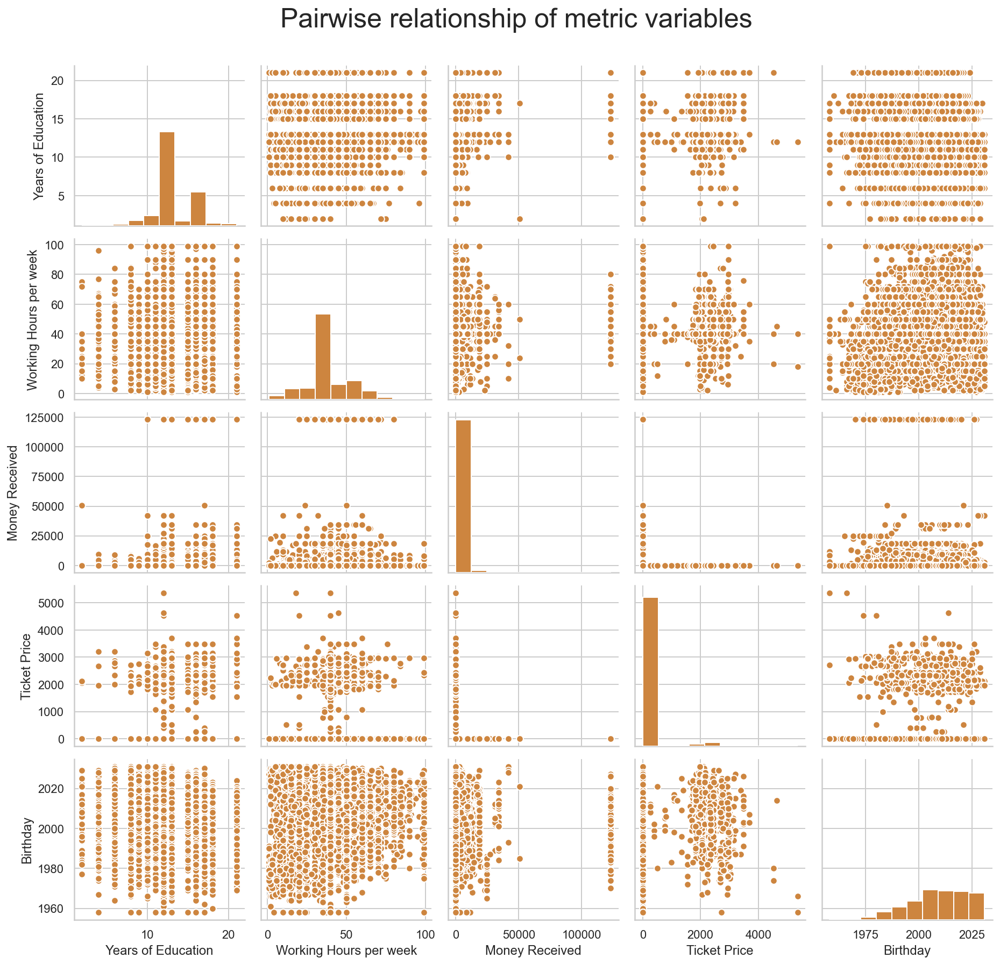

In [14]:
# Checking metrics variables' distribution and pairwise relationship
sns.set(style="whitegrid")

# Setting pairgrid
g = sns.PairGrid(metric)

# Populating pairgrid
mdg = g.map_diag(plt.hist, edgecolor="w", color="peru")
mog = g.map_offdiag(plt.scatter, edgecolor="w", color="peru", s=40)
    
# Layout
plt.subplots_adjust(top=0.92)
plt.suptitle("Pairwise relationship of metric variables", fontsize=25)

plt.show()

Text(0.5, 0.98, 'Distribution of non-metric variables')

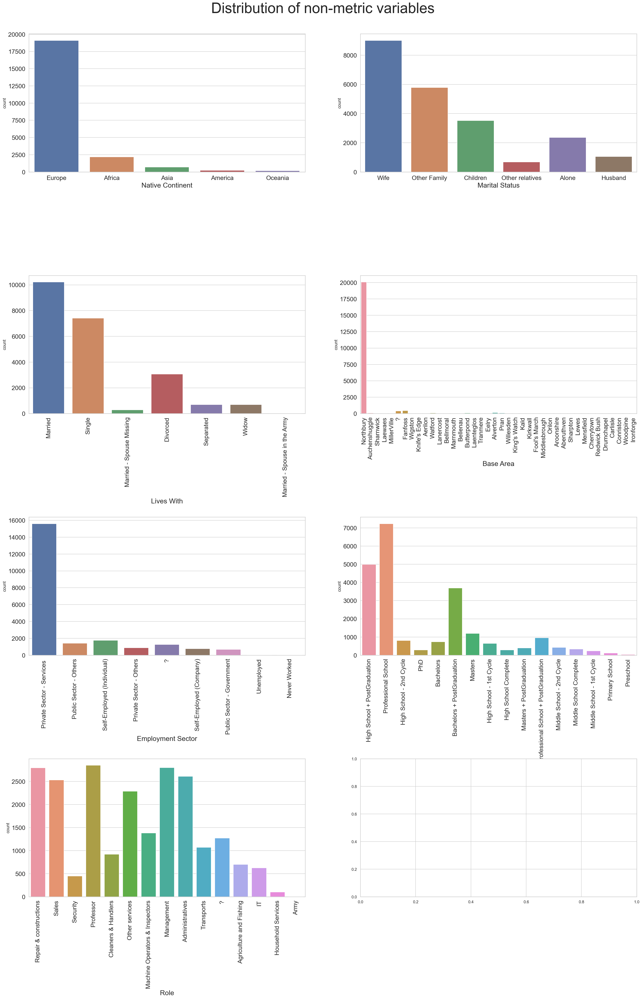

In [15]:
# Funciona
sns.set_style("whitegrid")
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(30,40))

ax1=sns.countplot(non_metric["Native Continent"], ax=axes[0,0])
ax2=sns.countplot(non_metric["Lives with"], ax=axes[0,1])
ax3=sns.countplot(non_metric["Marital Status"], ax=axes[1,0])
ax4=sns.countplot(non_metric["Base Area"], ax=axes[1,1])
ax5=sns.countplot(non_metric["Employment Sector"], ax=axes[2,0])
ax6=sns.countplot(non_metric["Education Level"], ax=axes[2,1])
ax7=sns.countplot(non_metric["Role"], ax=axes[3,0])
# ax8=sns.countplot(non_metric["Birthday"], ax=axes[3,1])

ax1.tick_params(labelsize=17)
ax1.set_xlabel(xlabel='Native Continent',fontsize = 19)

ax2.tick_params(labelsize=17)
ax2.set_xlabel(xlabel='Marital Status',fontsize = 19)

ax3.tick_params(labelsize=17)
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=90)
ax3.set_xlabel(xlabel='Lives With',fontsize = 19)

ax4.tick_params(labelsize=17)
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=90)
ax4.set_xlabel(xlabel='Base Area',fontsize = 19)

ax5.tick_params(labelsize=17)
ax5.set_xticklabels(ax5.get_xticklabels(), rotation=90)
ax5.set_xlabel(xlabel='Employment Sector',fontsize = 19)

ax6.tick_params(labelsize=17)
ax6.set_xticklabels(ax6.get_xticklabels(), rotation=90)
ax6.set_xlabel(xlabel='Education Level',fontsize = 19)

ax7.tick_params(labelsize=17)
ax7.set_xticklabels(ax7.get_xticklabels(), rotation=90)
ax7.set_xlabel(xlabel='Role',fontsize = 19)

# ax8.tick_params(labelsize=17)
# ax8.set_xticklabels(ax.get_xticklabels(), rotation=90)
# ax8.set_xlabel(xlabel='Birthday',fontsize = 19)

plt.subplots_adjust(top=0.95,hspace=0.75)
plt.suptitle("Distribution of non-metric variables", fontsize=40)

In [16]:
# Looking at the plots above, we can see the distribution of the values per category, for each categorical variables.
# With this, we see that there are 3 variables containing "?" as a value, which we understand are be null values
# So, here we are replacing those ? for null values, to analyze them more efficiently
df_train=df_train.replace('?', np.nan)

In [17]:
# Now we can already see how many missing values each variable has
df_train.isna().sum()

Name                         0
Birthday                     0
Native Continent             0
Marital Status               0
Lives with                   0
Base Area                  395
Education Level              0
Years of Education           0
Employment Sector         1264
Role                      1271
Working Hours per week       0
Money Received               0
Ticket Price                 0
dtype: int64

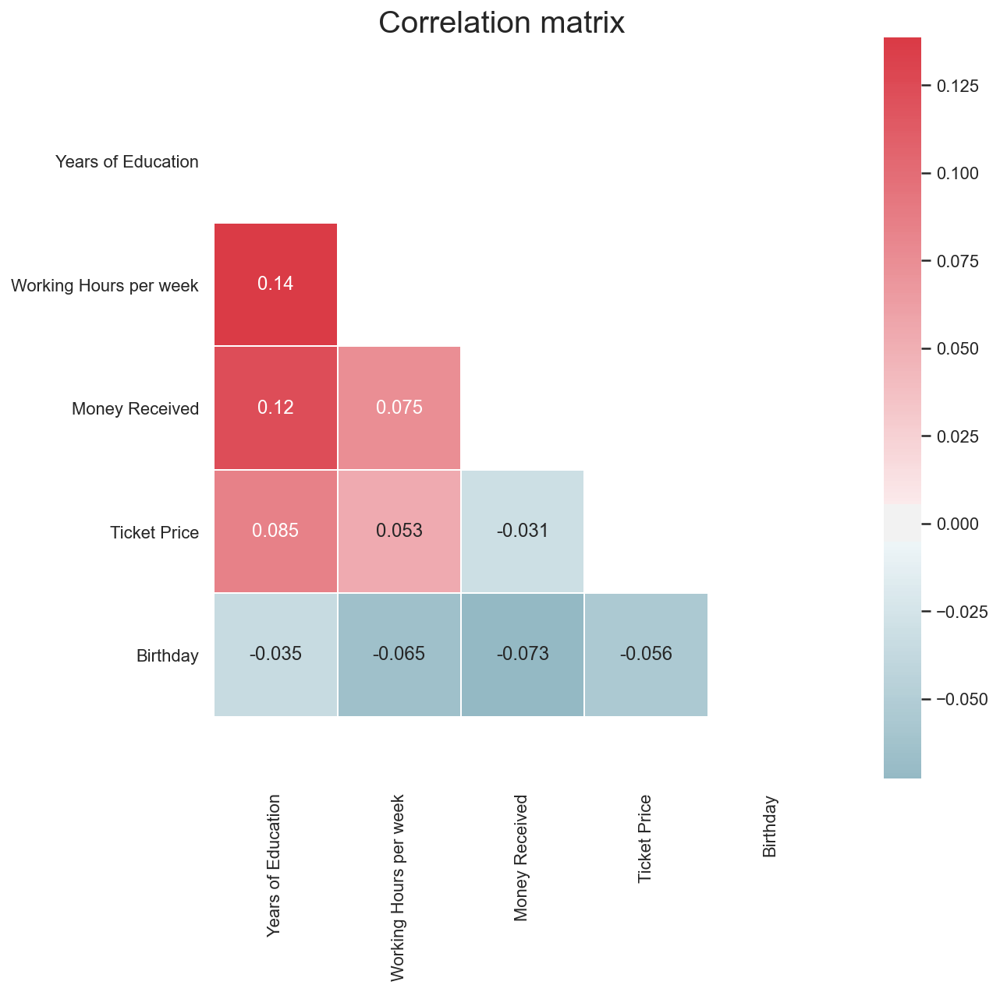

In [18]:
#inutil mas func
sns.set(style="white")

# Compute the correlation matrix
corr = metric.corr() #Getting correlation of numerical variables

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool) #Return an array of zeros (Falses) with the same shape and type as a given array
mask[np.triu_indices_from(mask)] = True #The upper-triangle array is now composed by True values

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(12, 8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True) #Make a diverging palette between two HUSL colors. Return a matplotlib colormap object.

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, ax=ax, annot=True)

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Correlation matrix", fontsize=20)
plt.yticks(rotation=0)
plt.xticks(rotation=90)
# Fixing the bug of partially cut-off bottom and top cells
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

plt.show()

In [19]:
pd.set_option('display.max_rows', 500)
df_train.groupby(["Base Area","Role"])["Role"].count()

Base Area      Role                          
Aberuthven     Administratives                      5
               Cleaners & Handlers                  3
               Household Services                   1
               IT                                   1
               Machine Operators & Inspectors       4
               Other services                       2
               Professor                            1
               Repair & constructions               4
               Sales                                2
Aerilon        Administratives                      2
               Agriculture and Fishing              1
               Cleaners & Handlers                  6
               Household Services                   1
               IT                                   2
               Machine Operators & Inspectors       6
               Management                           3
               Other services                       1
               Professor            

In [20]:
pd.crosstab(df_train['Base Area'], df_train['Role'],  margins = True)

Role,Administratives,Agriculture and Fishing,Army,Cleaners & Handlers,Household Services,IT,Machine Operators & Inspectors,Management,Other services,Professor,Repair & constructions,Sales,Security,Transports,All
Base Area,,,,,,,,,,,,,,,
Aberuthven,5,0,0,3,1,1,4,0,2,1,4,2,0,0,23
Aerilon,2,1,0,6,1,2,6,3,1,6,9,3,0,3,43
Alverton,28,3,0,4,1,9,10,9,22,19,6,13,2,1,127
Aroonshire,7,1,0,3,1,0,6,14,8,7,4,6,0,6,63
Auchenshuggle,3,2,0,7,5,0,4,2,29,4,14,5,0,3,78
Bellenau,0,0,0,0,0,0,2,3,0,2,0,0,1,0,8
Bellmoral,6,0,0,2,1,1,6,2,5,3,8,2,0,2,38
Butterpond,14,0,0,4,0,1,5,12,3,26,9,9,4,3,90
Carlisle,4,0,0,0,0,2,2,1,3,1,2,1,0,1,17


In [21]:
pd.crosstab(df_train['Marital Status'], df_train['Lives with'], margins=True)

Lives with,Alone,Children,Husband,Other Family,Other relatives,Wife,All
Marital Status,,,,,,,
Divorced,1113,227,0,1657,75,0,3072
Married,0,73,1042,12,85,9007,10219
Married - Spouse Missing,85,33,0,141,25,0,284
Married - Spouse in the Army,0,1,7,0,1,5,14
Separated,302,69,0,289,39,0,699
Single,607,3106,0,3281,422,0,7416
Widow,255,10,0,397,34,0,696
All,2362,3519,1049,5777,681,9012,22400


## Coherence Checks

In [22]:
#MUDAR
#Check if there is someone with more than 70 years that has Employment Sector not null
df_train[(metric.Birthday<1978)]
#& (metric["Money Received"]==0)] that did not receive money to go

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,
12530,Mrs. Carolyn Tucker,1976-02-03,Europe,Widow,Other Family,Northbury,High School - 2nd Cycle,11,NaN,NaN,24,0,0
12535,Mr. Evan Young,1975-02-13,Europe,Married,Wife,Aerilon,Masters,17,Public Sector - Others,Professor,10,0,0
12556,Mr. Jason MacLeod,1975-05-06,Europe,Married,Wife,Northbury,High School - 2nd Cycle,11,NaN,NaN,8,0,0
12633,Mr. Brandon Henderson,1969-03-29,Europe,Married,Wife,Northbury,Bachelors + PostGraduation,16,Self-Employed (Company),Sales,20,0,0
12641,Mr. Joe Simpson,1974-08-10,Europe,Divorced,Other relatives,Northbury,Masters + PostGraduation,18,Self-Employed (Individual),Professor,40,0,0
12706,Mr. Joe Morrison,1972-08-25,Europe,Widow,Other Family,Northbury,Middle School Complete,9,NaN,NaN,25,0,0
12738,Mr. Andrew Grant,1977-02-13,Europe,Married,Wife,Northbury,Bachelors + PostGraduation,16,Self-Employed (Company),Management,60,0,2942
12739,Mr. Christian Knox,1965-08-08,Europe,Divorced,Other Family,Northbury,Professional School,12,Self-Employed (Company),Sales,20,0,0
12783,Mr. Nathan Skinner,1958-03-14,Europe,Married,Wife,Willesden,Professional School,12,Private Sector - Services,Repair & constructions,50,11545,0


In [23]:
# Check if there is anyone born after the year of this experiment (2048) 
len(df_train[(metric.Birthday>2048)])

0

In [24]:
# Check the oldest year of birth and most recent one
print(metric.Birthday.min(),metric.Birthday.max())

1958 2031


In [25]:
# Check if there are negative amounts of money
df_train[(df_train["Money Received"]<0)|(df_train["Ticket Price"]<0)]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,


In [26]:
# Check if there is anyone who paid for the ticket and at the same time received money to join the experiment
df_train[(df_train["Ticket Price"]!=0) & (df_train["Money Received"]!=0)]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,


In [27]:
# Check if there is anyone with a certain level of education and years of education that don't match at all
df_train.groupby(["Years of Education","Education Level"])["Years of Education"].mean()

Years of Education  Education Level                     
2                   Preschool                                2
4                   Primary School                           4
6                   Middle School - 1st Cycle                6
8                   Middle School - 2nd Cycle                8
9                   Middle School Complete                   9
10                  High School - 1st Cycle                 10
11                  High School - 2nd Cycle                 11
12                  High School Complete                    12
                    Professional School                     12
13                  High School + PostGraduation            13
                    Professional School + PostGraduation    13
15                  Bachelors                               15
16                  Bachelors + PostGraduation              16
17                  Masters                                 17
18                  Masters + PostGraduation                1

In [28]:
df_train['Education Level']=df_train['Education Level'].replace('Preschool', 'No Relevant Education')

In [29]:
df_train["Education Level"].unique()

array(['High School + PostGraduation', 'Professional School',
       'High School - 2nd Cycle', 'PhD', 'Bachelors',
       'Bachelors + PostGraduation', 'Masters', 'High School - 1st Cycle',
       'High School Complete', 'Masters + PostGraduation',
       'Professional School + PostGraduation',
       'Middle School - 2nd Cycle', 'Middle School Complete',
       'Middle School - 1st Cycle', 'Primary School',
       'No Relevant Education'], dtype=object)

In [30]:
df_train['Years of Education']=df_train['Years of Education'].replace(2, 0)

In [31]:
df_train["Years of Education"].unique()


array([13, 12, 11, 21, 15, 16, 17, 10, 18,  8,  9,  6,  4,  0],
      dtype=int64)

In [32]:
# Check if there is anyone whose marital status seems incoherent with the person he/she lives with someone
df_train.groupby(["Marital Status","Lives with"] )["Lives with"].count()

Marital Status                Lives with     
Divorced                      Alone              1113
                              Children            227
                              Other Family       1657
                              Other relatives      75
Married                       Children             73
                              Husband            1042
                              Other Family         12
                              Other relatives      85
                              Wife               9007
Married - Spouse Missing      Alone                85
                              Children             33
                              Other Family        141
                              Other relatives      25
Married - Spouse in the Army  Children              1
                              Husband               7
                              Other relatives       1
                              Wife                  5
Separated                     Alone 

In [33]:
#AQUIII

ola=df_train.copy()
ola["age"]=2048-ola.Birthday.map(lambda x: x.year)
ola[ola.Birthday.map(lambda x: 2048-x.year)<(ola["Years of Education"]+5)]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price,age
CITIZEN_ID,,,,,,,,,,,,,,
14941,Miss Yvonne Henderson,2029-03-25,Africa,Single,Children,Lanercost,Bachelors + PostGraduation,16,NaN,NaN,40,0,0,19
16528,Miss Ava Glover,2028-07-15,Africa,Single,Other relatives,Northbury,Bachelors + PostGraduation,16,Private Sector - Services,Sales,30,0,0,20
24242,Miss Pippa Anderson,2024-02-01,Europe,Single,Other Family,Fool's March,PhD,21,Private Sector - Others,Professor,99,0,0,24
24843,Mr. Gavin Thomson,2028-09-13,Europe,Single,Children,Northbury,Masters,17,Private Sector - Services,Management,25,0,0,20
27833,Miss Sue Randall,2030-04-08,Europe,Single,Children,Northbury,Masters,17,Public Sector - Others,Professor,60,0,0,18
28849,Mr. Jonathan Oliver,2031-02-05,Europe,Single,Children,Northbury,High School + PostGraduation,13,Private Sector - Services,Administratives,20,0,0,17
33939,Mr. Isaac Alsop,2027-04-20,Europe,Single,Children,Northbury,Masters,17,Private Sector - Others,Transports,15,0,0,21


In [34]:
# Check if there is anyone with more years of education than his/her age
df_train[df_train.Birthday.map(lambda x: 2048-x.year)<(df_train["Years of Education"]+5)]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,
14941,Miss Yvonne Henderson,2029-03-25,Africa,Single,Children,Lanercost,Bachelors + PostGraduation,16,NaN,NaN,40,0,0
16528,Miss Ava Glover,2028-07-15,Africa,Single,Other relatives,Northbury,Bachelors + PostGraduation,16,Private Sector - Services,Sales,30,0,0
24242,Miss Pippa Anderson,2024-02-01,Europe,Single,Other Family,Fool's March,PhD,21,Private Sector - Others,Professor,99,0,0
24843,Mr. Gavin Thomson,2028-09-13,Europe,Single,Children,Northbury,Masters,17,Private Sector - Services,Management,25,0,0
27833,Miss Sue Randall,2030-04-08,Europe,Single,Children,Northbury,Masters,17,Public Sector - Others,Professor,60,0,0
28849,Mr. Jonathan Oliver,2031-02-05,Europe,Single,Children,Northbury,High School + PostGraduation,13,Private Sector - Services,Administratives,20,0,0
33939,Mr. Isaac Alsop,2027-04-20,Europe,Single,Children,Northbury,Masters,17,Private Sector - Others,Transports,15,0,0


In [35]:
#unemployed citizens have Role and Working Hours different than 0
df_train[["Employment Sector", "Role", "Working Hours per week"]][df_train["Employment Sector"]=="Unemployed"]

,Employment Sector,Role,Working Hours per week
CITIZEN_ID,,,
12567,Unemployed,Cleaners & Handlers,40
15572,Unemployed,Agriculture and Fishing,10
16852,Unemployed,Transports,20
17274,Unemployed,Administratives,12
21062,Unemployed,Agriculture and Fishing,50
22741,Unemployed,Agriculture and Fishing,20
27493,Unemployed,Repair & constructions,40
29340,Unemployed,Agriculture and Fishing,65
33010,Unemployed,Other services,55


In [36]:
#Never worked citizens have Role and Working Hours different than 0
df_train[["Employment Sector", "Role", "Working Hours per week"]][df_train["Employment Sector"]=="Never Worked"]

,Employment Sector,Role,Working Hours per week
CITIZEN_ID,,,
13792,Never Worked,NaN,40
22674,Never Worked,NaN,30
23583,Never Worked,NaN,10
24701,Never Worked,NaN,40
27002,Never Worked,NaN,4
32390,Never Worked,NaN,40
33185,Never Worked,NaN,35


In [37]:
df_train["Working Hours per week"][(df_train["Employment Sector"]=="Unemployed") | (df_train["Employment Sector"]=="Never Worked")]=0

In [38]:
df_train["Role"][(df_train["Employment Sector"]=="Never Worked")]="No Role"

In [39]:
df_train[["Employment Sector", "Role", "Working Hours per week"]][(df_train["Employment Sector"]=="Unemployed") | (df_train["Employment Sector"]=="Never Worked")]

,Employment Sector,Role,Working Hours per week
CITIZEN_ID,,,
12567,Unemployed,Cleaners & Handlers,0
13792,Never Worked,No Role,0
15572,Unemployed,Agriculture and Fishing,0
16852,Unemployed,Transports,0
17274,Unemployed,Administratives,0
21062,Unemployed,Agriculture and Fishing,0
22674,Never Worked,No Role,0
22741,Unemployed,Agriculture and Fishing,0
23583,Never Worked,No Role,0


## Outliers

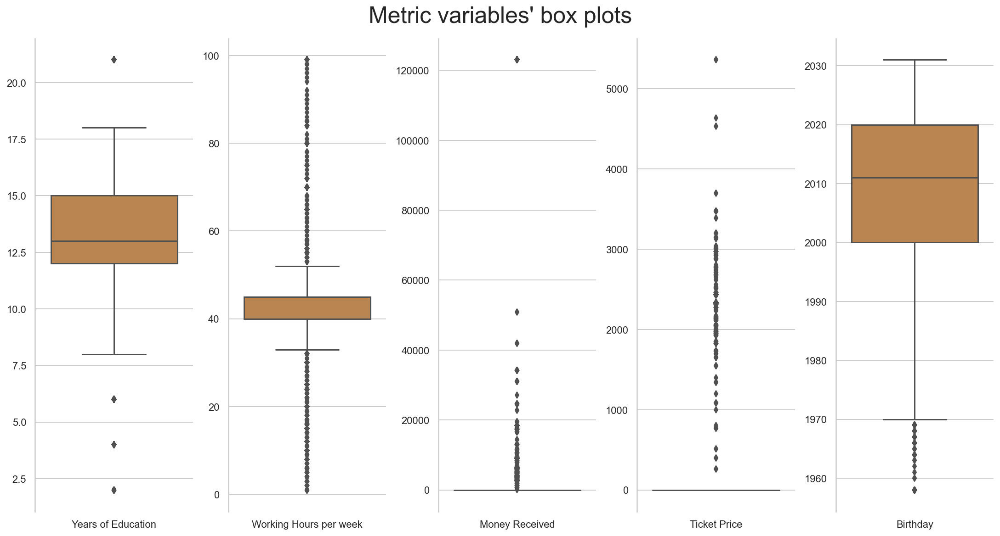

In [40]:
sns.set(style="whitegrid")

data = pd.melt(metric)
plot_features = metric.columns

#Prepare figure layout
fig, axes = plt.subplots(1, len(plot_features), figsize=(15,8), constrained_layout=True)
    
# Draw the boxplots
for i in zip(axes, plot_features):
    sns.boxplot(x="variable", y="value", data=data.loc[data["variable"]==i[1]], ax=i[0], color='peru')
    i[0].set_xlabel("")
    i[0].set_ylabel("")

# Finalize the plot
plt.suptitle("Metric variables' box plots", fontsize=25)
sns.despine(bottom=True)

plt.show()

In [41]:
#test
df_train[df_train["Money Received"]>120000] 

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,
12667,Mr. Alexander Duncan,1997-03-17,Oceania,Married,Wife,Sharnwick,Masters + PostGraduation,18,Self-Employed (Individual),Professor,70,122999,0
12839,Mr. Sam Black,1985-05-26,Europe,Married,Wife,Northbury,Professional School,12,Private Sector - Services,Repair & constructions,40,122999,0
13363,Mr. Jason Dickens,2009-01-20,Europe,Married,Wife,Northbury,Masters,17,Private Sector - Services,Professor,40,122999,0
13419,Mr. Harry Parr,1999-09-29,Europe,Married,Wife,Northbury,Masters,17,Private Sector - Others,Sales,80,122999,0
13445,Mr. Jacob Wilson,2008-06-28,Europe,Married,Wife,Northbury,Masters + PostGraduation,18,Self-Employed (Individual),Professor,70,122999,0
13557,Mr. Liam Abraham,1995-05-17,Europe,Married,Wife,Northbury,Professional School,12,Self-Employed (Company),Sales,40,122999,0
13759,Mrs. Lauren Morgan,2012-07-31,Africa,Married,Husband,Northbury,High School + PostGraduation,13,Private Sector - Services,Administratives,40,122999,0
13809,Mr. Jack Kerr,2008-05-23,Asia,Married,Wife,NaN,Masters + PostGraduation,18,Private Sector - Services,Professor,40,122999,0
14070,Mr. Joseph Buckland,1992-07-20,Europe,Married,Wife,Northbury,Masters + PostGraduation,18,Self-Employed (Company),Professor,40,122999,0


In [42]:
df_train["Working Hours per week"].describe()

count    22400.000000
mean        40.456696
std         12.414943
min          0.000000
25%         40.000000
50%         40.000000
75%         45.000000
max         99.000000
Name: Working Hours per week, dtype: float64

#RECOMENTAR

#using the IQR method to filter outliers: the scatter plot was impossible to analyze with the outliers, and there are some
#very extreme values on 'precoContratual' and, especially, on 'prazoExecucao'

#calculate the first and third quantiles:
q25 = df_train['Working Hours per week'].quantile(.25)
q75 = df_train['Working Hours per week'].quantile(.75)
#calculate the inter-quartile range:
iqr = (q75 - q25)

#calculate the lower and upper fence:
multiplicator = 6 #5 or 6 looks better; with 1.5 (the "official") or 2 you delete too much of the data
upper_lim = q75 + multiplicator * iqr
lower_lim = q25 - multiplicator * iqr

#filtering the outliers based on the IQR limits
df_train_new = df_train[(df_train['Working Hours per week'] > lower_lim) & (df_train['Working Hours per week'] < upper_lim)]
print('Percentage of data kept after removing outliers:', np.round(df_train_new.shape[0] / df_train.shape[0], 4))

We decided not to eliminate outliers on "Money Received", since when observing the value that was more distant from the rest, we concluded that there were several people with that high value (122999), all having a relatively important role and high hours of work. 

Also, we do not consider relevant the amount itself of money received or payed, but instead, if the person received or payed to go. 

sns.set(style="whitegrid")
sns.boxplot(x="Working Hours per week", data=df_train_new, color='peru')
plt.suptitle("Working Hours Without Outliers", fontsize=20)
plt.show()

In [43]:
# But if we wer to remove them, this would be it
# df_train_out=df_train[df_train["Money Received"]<120000] 

In [44]:
#number of citizens that have less than 7.5 years of education to conclude if they might be outliers
len(df_train[df_train["Years of Education"]<7.5])

392

In [45]:
# Test if the variable follows a normal distribution

# normality test
stat, p = shapiro(df_train["Working Hours per week"])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.885, p=0.000
Sample does not look Gaussian (reject H0)


## Missing Values

#### 1st method - impute with the mode

In [46]:
df_train.isna().sum()

Name                         0
Birthday                     0
Native Continent             0
Marital Status               0
Lives with                   0
Base Area                  395
Education Level              0
Years of Education           0
Employment Sector         1264
Role                      1264
Working Hours per week       0
Money Received               0
Ticket Price                 0
dtype: int64

In [47]:
df_train1=df_train.copy()

In [48]:
modes = non_metric.mode().loc[0]
df_train1.fillna(modes, inplace=True)

#### 2nd method - imupte with the mode of categories in common

In [49]:
# understand if certain non-numeric variables are dependent or not from the ones with missing values

In [50]:
# Create a function that performs the Chi2 test for independence, to check for association between each variable with no missing
# values and each of the ones with missings

def check_association(col1,col2):
    # contingency table
    tab=pd.crosstab(df_train[col1], df_train[col2], margins=False).values
    stat, p, dof, expected = chi2_contingency(tab)

    # interpret test-statistic
    prob = 0.95
    critical = chi2.ppf(prob, dof)
    print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
    
    if abs(stat) >= critical:
        print(col1,'and',col2,'are dependent (reject H0).')
    else:
        print(col1,'and',col2,'are independent (fail to reject H0).')
        
    # interpret p-value
    alpha = 1.0 - prob
    print('significance=%.3f, p=%.3f' % (alpha, p))
    
    if p <= alpha:
        print(col1,'and',col2,'are dependent (reject H0).\n')
    else:
        print(col1,'and',col2,'are independent (fail to reject H0).\n')

In [51]:
# FIRST: Marital Status

check_association('Marital Status','Base Area')
check_association('Marital Status','Employment Sector')
check_association('Marital Status','Role')

probability=0.950, critical=264.224, stat=707.714
Marital Status and Base Area are dependent (reject H0).
significance=0.050, p=0.000
Marital Status and Base Area are dependent (reject H0).

probability=0.950, critical=58.124, stat=798.754
Marital Status and Employment Sector are dependent (reject H0).
significance=0.050, p=0.000
Marital Status and Employment Sector are dependent (reject H0).

probability=0.950, critical=106.395, stat=2136.649
Marital Status and Role are dependent (reject H0).
significance=0.050, p=0.000
Marital Status and Role are dependent (reject H0).



In [52]:
# SECOND: Education Level

check_association('Education Level','Base Area')
check_association('Education Level','Employment Sector')
check_association('Education Level','Role')

probability=0.950, critical=626.650, stat=6057.678
Education Level and Base Area are dependent (reject H0).
significance=0.050, p=0.000
Education Level and Base Area are dependent (reject H0).

probability=0.950, critical=129.918, stat=1544.322
Education Level and Employment Sector are dependent (reject H0).
significance=0.050, p=0.000
Education Level and Employment Sector are dependent (reject H0).

probability=0.950, critical=244.808, stat=10712.853
Education Level and Role are dependent (reject H0).
significance=0.050, p=0.000
Education Level and Role are dependent (reject H0).



In [53]:
# Seeing both of these variables are associated with the three variables with missing values, using the similarities between people
# in these categories, might be useful to discover their characteristics in the missing variables

In [54]:
# Copy the dataframe into another to apply the changes there before
df_train2=df_train.copy()

# Create a function to impute the missing values by the mode of the records belonging to the same classes of Marital Status and Education Level
def impute_mode_by_cat(col):
    exp=df_train2[df_train2[col].isnull()].reset_index()
    gr=df_train2.groupby(["Education Level","Marital Status"])[col].agg(pd.Series.mode)
    
    # if there are null values in the group by, replace them by the overall mode of the orginal variable
    for i in range(len(gr)):
        if len(gr[i])==0:
            gr[i]=df_train2[col].mode()[0]


    # define the values of base area in the new auxiliary dataset as the mode of the base are values for the observations with the
    # same level of education and marital status, because at least to some extent, they are more similar than the others       
    for i in range(len(exp)):
        for x in range(len(gr)):
            if (exp['Education Level'][i]==gr.index[x][0]) and (exp['Marital Status'][i]==gr.index[x][1]):
                exp[col][i]=gr[x]
                
    # if it's bimodal (has more than one mode, keep only the first one provided)
    for i in range(len(exp)):
        if type(exp[col][i])!=str:
            exp[col][i]=df_train2[col].mode()[0]

    # finally, replace the null values in Base Area in the original dataset by the values acquired before
    for i in range(len(exp)):
        df_train2.loc[exp['CITIZEN_ID'][i],col]=exp[col][i]
        
    return df_train2

In [55]:
df_train2[df_train2['Base Area'].isnull()]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,
12516,Mr. Jason Gray,2024-09-26,Africa,Single,Other Family,NaN,Bachelors,15,Private Sector - Services,Sales,40,0,0
12583,Mr. Joseph Avery,2008-09-06,Europe,Married,Wife,NaN,Bachelors + PostGraduation,16,Self-Employed (Company),Sales,40,0,0
12700,Mr. Colin Graham,2017-02-14,Europe,Single,Other relatives,NaN,Bachelors + PostGraduation,16,Public Sector - Others,Professor,40,0,0
12771,Mrs. Emma Gray,2005-02-22,Europe,Married - Spouse Missing,Other Family,NaN,PhD,21,Private Sector - Services,Professor,40,0,0
12845,Mr. Alexander Rampling,2022-02-28,Africa,Single,Other Family,NaN,Bachelors + PostGraduation,16,Private Sector - Services,Management,50,0,0
12875,Mr. Owen Scott,2027-07-20,Europe,Single,Children,NaN,High School + PostGraduation,13,Private Sector - Services,Machine Operators & Inspectors,40,0,0
12891,Mr. Anthony McDonald,2020-10-06,Europe,Single,Other Family,NaN,High School - 2nd Cycle,11,Private Sector - Services,Repair & constructions,40,0,0
12895,Mrs. Bella Hemmings,1991-05-07,Europe,Widow,Alone,NaN,Professional School,12,Private Sector - Services,Other services,30,0,0
12956,Mr. William Wilson,2004-05-20,Europe,Married,Wife,NaN,Professional School,12,Self-Employed (Company),Transports,60,0,0


In [56]:
df_train2=impute_mode_by_cat('Base Area')

In [57]:
df_train2[df_train2['Employment Sector'].isnull()]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,
12508,Miss Gabrielle Cameron,2028-02-09,Europe,Single,Other relatives,Northbury,Professional School,12,NaN,NaN,35,0,0
12511,Miss Amy Churchill,2029-02-10,Europe,Single,Children,Northbury,High School + PostGraduation,13,NaN,NaN,40,0,0
12523,Mr. William Sanderson,1997-10-08,Europe,Married,Wife,Northbury,Masters,17,NaN,NaN,40,0,0
12529,Miss Deirdre Lyman,2018-03-28,Asia,Single,Other Family,Knife's Edge,Bachelors + PostGraduation,16,NaN,NaN,50,0,0
12530,Mrs. Carolyn Tucker,1976-02-03,Europe,Widow,Other Family,Northbury,High School - 2nd Cycle,11,NaN,NaN,24,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
34795,Mr. Luke Smith,1985-03-05,Europe,Married,Wife,Northbury,Professional School,12,NaN,NaN,20,0,0
34814,Mr. Stewart Newman,1990-01-23,America,Married - Spouse Missing,Alone,Northbury,Primary School,4,NaN,NaN,40,0,0
34823,Mr. Jonathan Slater,2006-05-27,Europe,Married,Wife,Northbury,High School + PostGraduation,13,NaN,NaN,60,0,0


In [58]:
df_train2=impute_mode_by_cat('Employment Sector')

In [59]:
df_train2[df_train2['Role'].isnull()]

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,Working Hours per week,Money Received,Ticket Price
CITIZEN_ID,,,,,,,,,,,,,
12508,Miss Gabrielle Cameron,2028-02-09,Europe,Single,Other relatives,Northbury,Professional School,12,Private Sector - Services,NaN,35,0,0
12511,Miss Amy Churchill,2029-02-10,Europe,Single,Children,Northbury,High School + PostGraduation,13,Private Sector - Services,NaN,40,0,0
12523,Mr. William Sanderson,1997-10-08,Europe,Married,Wife,Northbury,Masters,17,Private Sector - Services,NaN,40,0,0
12529,Miss Deirdre Lyman,2018-03-28,Asia,Single,Other Family,Knife's Edge,Bachelors + PostGraduation,16,Private Sector - Services,NaN,50,0,0
12530,Mrs. Carolyn Tucker,1976-02-03,Europe,Widow,Other Family,Northbury,High School - 2nd Cycle,11,Private Sector - Services,NaN,24,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
34795,Mr. Luke Smith,1985-03-05,Europe,Married,Wife,Northbury,Professional School,12,Private Sector - Services,NaN,20,0,0
34814,Mr. Stewart Newman,1990-01-23,America,Married - Spouse Missing,Alone,Northbury,Primary School,4,Private Sector - Services,NaN,40,0,0
34823,Mr. Jonathan Slater,2006-05-27,Europe,Married,Wife,Northbury,High School + PostGraduation,13,Private Sector - Services,NaN,60,0,0


In [60]:
df_train2=impute_mode_by_cat('Role')

In [61]:
df_train2.isna().sum()

Name                      0
Birthday                  0
Native Continent          0
Marital Status            0
Lives with                0
Base Area                 0
Education Level           0
Years of Education        0
Employment Sector         0
Role                      0
Working Hours per week    0
Money Received            0
Ticket Price              0
dtype: int64

Text(0.5, 0.98, 'Distribution of variables with and without missing values')

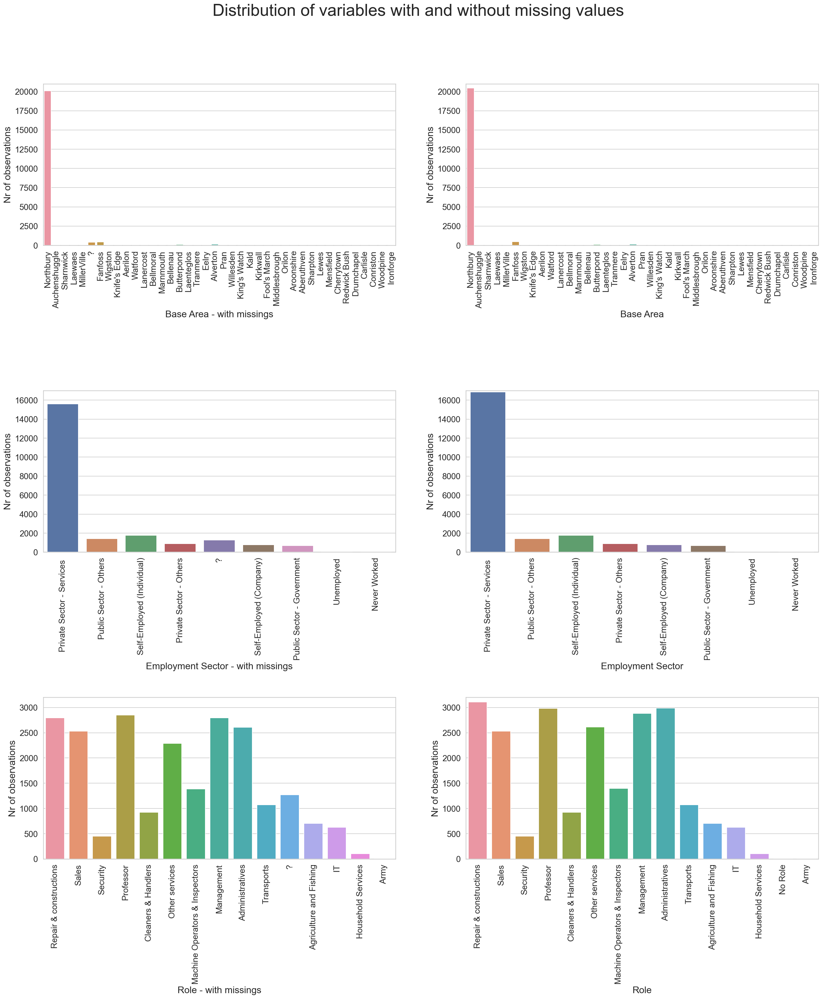

In [62]:
# Funciona
sns.set_style("whitegrid")
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(25,25))


axa=sns.countplot(df_train2["Base Area"], ax=axes[0,1])
axb=sns.countplot(df_train2["Employment Sector"], ax=axes[1,1])
axc=sns.countplot(df_train2["Role"], ax=axes[2,1])

ax4=sns.countplot(non_metric["Base Area"], ax=axes[0,0])
ax5=sns.countplot(non_metric["Employment Sector"], ax=axes[1,0])
ax7=sns.countplot(non_metric["Role"], ax=axes[2, 0])


axa.tick_params(labelsize=15)
axa.set_xticklabels(axa.get_xticklabels(), rotation=90)
axa.set_xlabel(xlabel='Base Area',fontsize = 17)
axa.set_ylabel(ylabel='Nr of observations',fontsize = 17)
axa.set(ylim=(0, 21000))

ax4.tick_params(labelsize=15)
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=90)
ax4.set_xlabel(xlabel='Base Area - with missings',fontsize = 17)
ax4.set_ylabel(ylabel='Nr of observations',fontsize = 17)
ax4.set(ylim=(0, 21000))

axb.tick_params(labelsize=15)
axb.set_xticklabels(axb.get_xticklabels(), rotation=90)
axb.set_xlabel(xlabel='Employment Sector',fontsize = 17)
axb.set_ylabel(ylabel='Nr of observations',fontsize = 17)
axb.set(ylim=(0, 17000))

ax5.tick_params(labelsize=15)
ax5.set_xticklabels(ax5.get_xticklabels(), rotation=90)
ax5.set_xlabel(xlabel='Employment Sector - with missings',fontsize = 17)
ax5.set_ylabel(ylabel='Nr of observations',fontsize = 17)
ax5.set(ylim=(0, 17000))

axc.tick_params(labelsize=15)
axc.set_xticklabels(axc.get_xticklabels(), rotation=90)
axc.set_xlabel(xlabel='Role',fontsize = 17)
axc.set_ylabel(ylabel='Nr of observations',fontsize = 17)
axc.set(ylim=(0, 3200))

ax7.tick_params(labelsize=15)
ax7.set_xticklabels(ax7.get_xticklabels(), rotation=90)
ax7.set_xlabel(xlabel='Role - with missings',fontsize = 17)
ax7.set_ylabel(ylabel='Nr of observations',fontsize = 17)
ax7.set(ylim=(0, 3200))

plt.subplots_adjust(top=0.9,hspace=0.9)
plt.suptitle("Distribution of variables with and without missing values", fontsize=30)

## Feature Engineering

In [63]:
#EXPLICARRR

# New variable for Age
df_train2["Age"]=df_train2.Birthday.map(lambda x: datetime.now().year+28-x.year)

In [64]:
df_train2[["Birthday","Age"]]

,Birthday,Age
CITIZEN_ID,,
12486,2003-07-01,45
12487,2006-01-25,42
12488,2009-05-10,39
12489,1985-03-25,63
12490,2015-05-29,33
...,...,...
34881,2023-03-15,25
34882,2025-03-07,23
34883,2022-07-20,26


In [65]:
# New variable for Gender - binary if it's a male or not
df_train2['Male'] = np.where(df_train2.Name.str.contains('Mrs|Miss'), '0', '1')

In [66]:
# Check the values for variable Marital Status
df_train2["Marital Status"].unique()

array(['Married', 'Single', 'Married - Spouse Missing', 'Divorced',
       'Separated', 'Widow', 'Married - Spouse in the Army'], dtype=object)

In [67]:
#In column Marital Status, join "Married" with 'Married - Spouse Missing' and 'Married - Spouse in the Army' since we do not consider this distintion relevant
df_train2["Marital Status_new"]=df_train2["Marital Status"]
df_train2["Marital Status_new"][(df_train2["Marital Status"].str.contains("Married")==True) & (df_train2["Marital Status"]!="Married")]="Married"

#In column Marital Status, join "Divorced" with 'Separated' in "Divorced or Separated"
df_train2["Marital Status_new"][(df_train2["Marital Status"]=="Separated") | (df_train2["Marital Status"]=="Divorced")]="Divorced or Separated"

df_train2["Marital Status_new"][(df_train2["Marital Status"]=="Married")]

CITIZEN_ID
12486    Married
12487    Married
12488    Married
12489    Married
12492    Married
          ...   
34876    Married
34877    Married
34878    Married
34879    Married
34880    Married
Name: Marital Status_new, Length: 10219, dtype: object

In [68]:
# New binary variable to determine whether the person is married
df_train2["Is Married"]='0'
df_train2["Is Married"][(df_train2["Marital Status_new"]=="Married")]='1'

In [69]:
df_train2["Marital Status_new"].unique()

array(['Married', 'Single', 'Divorced or Separated', 'Widow'],
      dtype=object)

In [70]:
df_train2["Is Married"]

CITIZEN_ID
12486    1
12487    1
12488    1
12489    1
12490    0
        ..
34881    0
34882    0
34883    0
34884    0
34885    0
Name: Is Married, Length: 22400, dtype: object

In [71]:
# Check the values for variable Education Level
df_train2["Education Level"].unique()

array(['High School + PostGraduation', 'Professional School',
       'High School - 2nd Cycle', 'PhD', 'Bachelors',
       'Bachelors + PostGraduation', 'Masters', 'High School - 1st Cycle',
       'High School Complete', 'Masters + PostGraduation',
       'Professional School + PostGraduation',
       'Middle School - 2nd Cycle', 'Middle School Complete',
       'Middle School - 1st Cycle', 'Primary School',
       'No Relevant Education'], dtype=object)

In [72]:
#In column Education Level, join all equal periods of education level

df_train2["Education Level_new"]=df_train2["Education Level"]

df_train2["Education Level_new"][(df_train2["Education Level"]=="Middle School - 1st Cycle") |
                    (df_train2["Education Level"]=="Middle School - 2nd Cycle")|
                    (df_train2["Education Level"]=="Middle School Complete")]="Middle School"

df_train2["Education Level_new"][(df_train2["Education Level"]=="High School - 1st Cycle") | 
                    (df_train2["Education Level"]=="High School - 2nd Cycle") | 
                    (df_train2["Education Level"]=="High School Complete")]="High School"

In [73]:
df_train2["Education Level_new"].unique()

array(['High School + PostGraduation', 'Professional School',
       'High School', 'PhD', 'Bachelors', 'Bachelors + PostGraduation',
       'Masters', 'Masters + PostGraduation',
       'Professional School + PostGraduation', 'Middle School',
       'Primary School', 'No Relevant Education'], dtype=object)

In [74]:
df_train2["Years of Education"][df_train2["Education Level_new"]=='Professional School'].unique()

array([12], dtype=int64)

In [75]:
df_train2["Years of Education"][df_train2["Education Level_new"]=='High School']

CITIZEN_ID
12489    11
12493    11
12505    10
12512    12
12524    11
         ..
34847    11
34856    10
34857    12
34858    10
34865    11
Name: Years of Education, Length: 1745, dtype: int64

In [76]:
#Join all without considering Post Graduation

df_train2["Education Level_new2"]=df_train2["Education Level_new"].copy()
df_train2["Education Level_new2"][(df_train2["Education Level_new2"]=="High School + PostGraduation")]="High School"
df_train2["Education Level_new2"][(df_train2["Education Level_new2"]=="Bachelors + PostGraduation")]="Bachelors"
df_train2["Education Level_new2"][(df_train2["Education Level_new2"]=="Professional School + PostGraduation")]="Professional School"
df_train2["Education Level_new2"][(df_train2["Education Level_new2"]=="Masters + PostGraduation")]="Masters"
df_train2[["Education Level_new", "Education Level_new2"]]

,Education Level_new,Education Level_new2
CITIZEN_ID,,
12486,High School + PostGraduation,High School
12487,Professional School,Professional School
12488,Professional School,Professional School
12489,High School,High School
12490,PhD,PhD
...,...,...
34881,Professional School,Professional School
34882,Professional School,Professional School
34883,Masters,Masters


In [77]:
#Binary that says if the citizen has Post Graduation or not

df_train2["PostGraduation"]=df_train2["Education Level_new"].map(lambda x: '1' if "+" in x else '0')
df_train2["PostGraduation"]

CITIZEN_ID
12486    1
12487    0
12488    0
12489    0
12490    0
        ..
34881    0
34882    0
34883    0
34884    1
34885    1
Name: PostGraduation, Length: 22400, dtype: object

In [78]:
# New binary variable related to Higher Education
# (includes at least one of the following: Post Graduation, Bachelors, Masters, PhD)

df_train2['Higher Education']=np.where(df_train2['Years of Education']>12, '1', '0')

In [79]:
# New binary variable that tells us if each person lives in the capital city or not
df_train2['Capital']= np.where(df_train2['Base Area']=='Northbury', '1', '0')

In [80]:
# New binary variable to determine whether the person belongs to Group B (people who were payed to participate in the mission)
df_train2['Group B']=np.where(df_train2['Money Received']!=0, '1', '0')

In [81]:
# New binary variable to determine whether the person belongs to Group C (people who payed to participate in the mission)
df_train2['Group C']=np.where(df_train2['Ticket Price']!=0, '1', '0')

In [82]:
df_train2.head()

,Name,Birthday,Native Continent,Marital Status,Lives with,Base Area,Education Level,Years of Education,Employment Sector,Role,...,Male,Marital Status_new,Is Married,Education Level_new,Education Level_new2,PostGraduation,Higher Education,Capital,Group B,Group C
CITIZEN_ID,,,,,,,,,,,,,,,,,,,,,
12486,Mr. Adam Glover,2003-07-01,Europe,Married,Wife,Northbury,High School + PostGraduation,13,Private Sector - Services,Repair & constructions,...,1,Married,1,High School + PostGraduation,High School,1,1,1,0,1
12487,Mr. Cameron McDonald,2006-01-25,Europe,Married,Wife,Northbury,Professional School,12,Public Sector - Others,Repair & constructions,...,1,Married,1,Professional School,Professional School,0,0,1,0,0
12488,Mr. Keith Davidson,2009-05-10,Europe,Married,Wife,Northbury,Professional School,12,Private Sector - Services,Sales,...,1,Married,1,Professional School,Professional School,0,0,1,0,1
12489,Mr. Alexander Gill,1985-03-25,Europe,Married,Wife,Northbury,High School - 2nd Cycle,11,Private Sector - Services,Security,...,1,Married,1,High School,High School,0,0,1,1,0
12490,Mr. Neil Piper,2015-05-29,Europe,Single,Other Family,Northbury,PhD,21,Self-Employed (Individual),Professor,...,1,Single,0,PhD,PhD,0,1,1,0,0


In [83]:
# publico ou privado ou self ou uneployed empl. sector
def sectors(a):
    if 'Private Sector' in a:
        return 'Private Sector'
    elif 'Public Sector' in a:
        return 'Public Sector'
    #we don't join the Self-Employeds bc the 'Company' ones have much more 1s on the target than the 'Individual'
    elif 'Self-Employed (Individual)' in a:
        return a
    elif 'Self-Employed (Company)' in a:
        return a
    else:
        return 'Unemployed / Never Worked'
    
df_train2['Employment Sector (simplified)'] = df_train2['Employment Sector'].map(sectors)

In [84]:
# binaria governo ou n empl. sector
df_train2['Government'] = df_train2['Employment Sector'].map(lambda x: '1' if 'Government' in x else '0')

In [85]:
df_train2.columns

Index(['Name', 'Birthday', 'Native Continent', 'Marital Status', 'Lives with',
       'Base Area', 'Education Level', 'Years of Education',
       'Employment Sector', 'Role', 'Working Hours per week', 'Money Received',
       'Ticket Price', 'Age', 'Male', 'Marital Status_new', 'Is Married',
       'Education Level_new', 'Education Level_new2', 'PostGraduation',
       'Higher Education', 'Capital', 'Group B', 'Group C',
       'Employment Sector (simplified)', 'Government'],
      dtype='object')

In [161]:
x_array = df_train2[["Ticket Price", "Money Received"]].values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x_array)
df= pd.DataFrame(x_scaled)

In [87]:
# sns.histplot(df[0][df[0]!=0]) why???

In [88]:
# sns.histplot(df[1][df[1]!=0]) why???

In [89]:
Median_Money_Received=df_train2["Money Received"][df_train2["Money Received"]>0].median()
Median_Ticket_Price=df_train2["Ticket Price"][df_train2["Ticket Price"]>0].median()

df_train2['Money Relevance']='0'
df_train2['Money Relevance'][df_train2["Money Received"]> Median_Money_Received] ='1'
df_train2['Money Relevance'][(df_train2["Money Received"]<= Median_Money_Received) & (df_train2["Money Received"]>0)]='2'

df_train2['Money Relevance'][df_train2["Ticket Price"]> Median_Ticket_Price] ='5'
df_train2['Money Relevance'][(df_train2["Ticket Price"]<= Median_Ticket_Price) & (df_train2["Ticket Price"]>0)] ='4'

df_train2['Money Relevance'][(df_train2["Ticket Price"]== 0) & (df_train2["Money Received"]==0)] ='3'

In [90]:
df_train2[["Ticket Price", "Money Received", "Money Relevance"]]

,Ticket Price,Money Received,Money Relevance
CITIZEN_ID,,,
12486,2273,0,4
12487,0,0,3
12488,2321,0,4
12489,0,5395,2
12490,0,0,3
...,...,...,...
34881,0,0,3
34882,0,0,3
34883,0,2674,2


In [91]:
#df_train2.drop(columns=["Ticket Price", "Money Received"]), inplace=True)

In [92]:
#interaction between these two: working more hours, has more impact on income with more year of education?
df_train2["Working hours * Years of Education"] = df_train["Working Hours per week"] * df_train["Years of Education"]

In [93]:
#Money received per year of education
df_train2['Money / YE']=0
df_train2['Money / YE'][df_train2["Years of Education"]!=0]=round(df_train["Money Received"] / df_train["Years of Education"], 2)

In [94]:
import math
df_train2['Log 10 of Money Received']=df_train2['Money Received'].map(lambda x: math.log10(x) if x!=0 else 0)
df_train2['Log 10 of Ticket Price']=df_train2['Ticket Price'].map(lambda x: math.log10(x) if x!=0 else 0)

## Feature Selection

In [95]:
df_train2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22400 entries, 12486 to 34885
Data columns (total 31 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   Name                                22400 non-null  object        
 1   Birthday                            22400 non-null  datetime64[ns]
 2   Native Continent                    22400 non-null  object        
 3   Marital Status                      22400 non-null  object        
 4   Lives with                          22400 non-null  object        
 5   Base Area                           22400 non-null  object        
 6   Education Level                     22400 non-null  object        
 7   Years of Education                  22400 non-null  int64         
 8   Employment Sector                   22400 non-null  object        
 9   Role                                22400 non-null  object        
 10  Working Hours per 

In [96]:
metric= df_train2.loc[:,(np.array(df_train2.dtypes=="int64")) | (np.array(df_train2.dtypes=="float64"))]

In [97]:
#Standardize
x = metric.values #returns a numpy array

min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
stand_metric= pd.DataFrame(x_scaled, columns=metric.columns, index=metric.index)

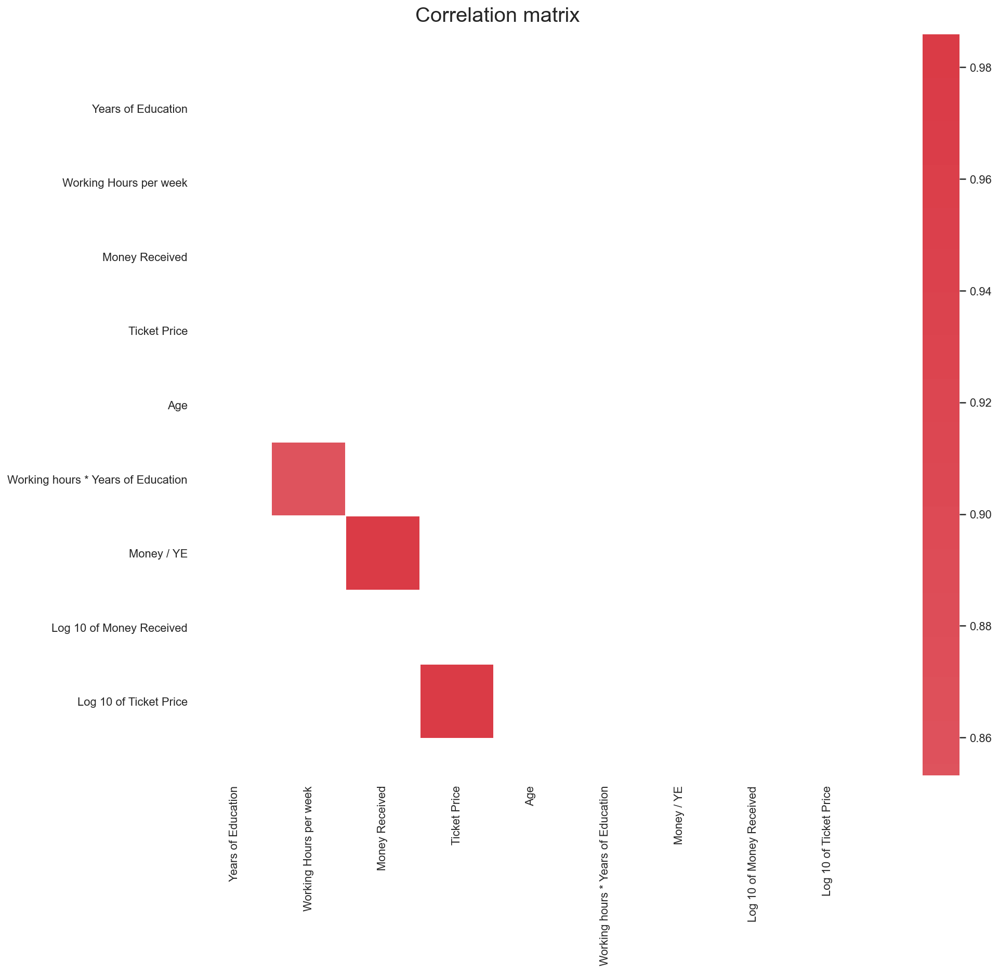

In [98]:
sns.set(style="white")

# Compute the correlation matrix
corr = stand_metric.corr() #Getting correlation of numerical variables

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool) #Return an array of zeros (Falses) with the same shape and type as a given array
mask[np.triu_indices_from(mask)] = True #The upper-triangle array is now composed by True values

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(20, 12))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True) #Make a diverging palette between two HUSL colors. Return a matplotlib colormap object.

# Draw the heatmap with the mask and correct aspect ratio
#show only corr bigger than 0.6 in absolute value
sns.heatmap(corr[(corr>=.7) | (corr<=-.7)], mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, ax=ax)

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Correlation matrix", fontsize=20)
plt.yticks(rotation=0)
plt.xticks(rotation=90)
# Fixing the bug of partially cut-off bottom and top cells
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

plt.show()

In [99]:
#correlation between Money Received and Log 10 of Money Received
round(corr['Money Received']['Log 10 of Money Received'], 3)

0.561

In [100]:
#no of features
nof_list=np.arange(1,len(stand_metric.columns)+1)  
high_score=0

#Variable to store the optimum features
nof=0           
score_list =[]
for n in range(len(nof_list)):
    # we are going to see in the next class this "train_test_split()"...
    X_train, X_test, y_train, y_test = train_test_split(stand_metric,target, test_size = 0.3, random_state = 0)
    
    model = LogisticRegression()
    rfe = RFE(model,nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train,y_train)
    X_test_rfe = rfe.transform(X_test)
    model.fit(X_train_rfe,y_train)
    
    score = model.score(X_test_rfe,y_test)
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 7
Score with 7 features: 0.811607


In [101]:
rfe = RFE(estimator = model, n_features_to_select = 7)
X_rfe = rfe.fit_transform(X = stand_metric, y = target)
model = LogisticRegression().fit(X = X_rfe,y = target)
selected_features = pd.Series(rfe.support_, index = stand_metric.columns)
selected_features

Years of Education                     True
Working Hours per week                 True
Money Received                         True
Ticket Price                           True
Age                                    True
Working hours * Years of Education     True
Money / YE                             True
Log 10 of Money Received              False
Log 10 of Ticket Price                False
dtype: bool

Best alpha using built-in LassoCV: 0.000026
Best score using built-in LassoCV: 0.254031
Lasso picked 9 variables and eliminated the other 0 variables


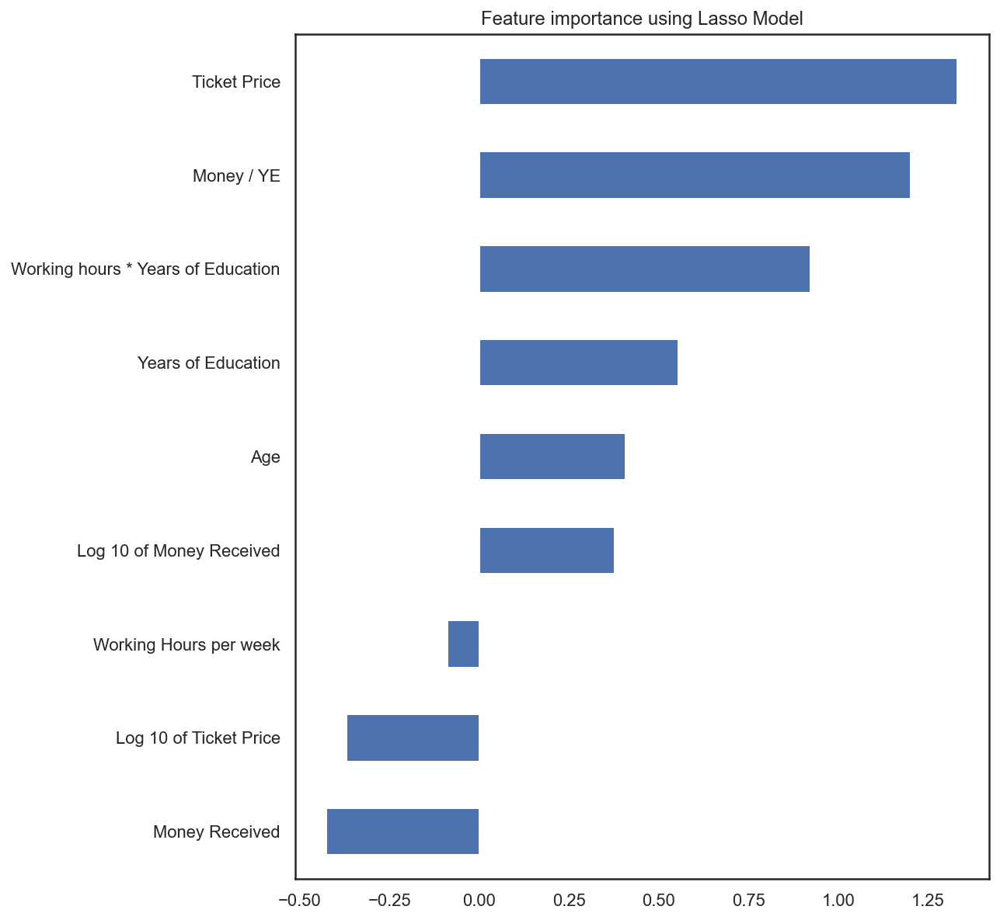

In [102]:
#Lasso
def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
reg = LassoCV()

reg.fit(X=stand_metric, y=target)
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X = stand_metric,y = target))
coef = pd.Series(reg.coef_, index = stand_metric.columns)
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
plot_importance(coef,'Lasso')

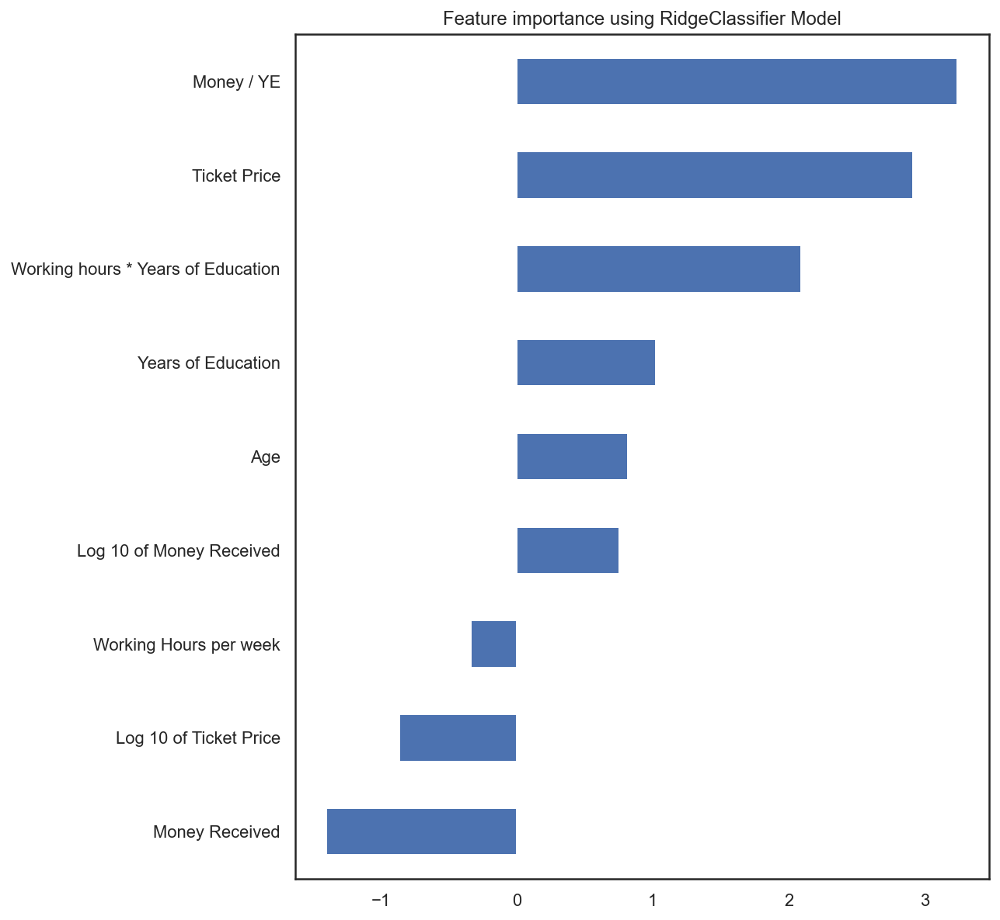

In [103]:
ridge = RidgeClassifierCV().fit(X = stand_metric,y = target)
coef_ridge = pd.Series(ridge.coef_[0], index = stand_metric.columns)

def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
plot_importance(coef_ridge,'RidgeClassifier')

### Forward, backward

In [104]:
#from sklearn import tree
#from sklearn.model_selection import KFold
#import sklearn

In [105]:
model = LogisticRegression()

In [106]:
forward = SFS(model, k_features=9, forward=True, scoring="accuracy", cv = None) #floating=False

forward.fit(stand_metric, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(), k_features=9,
                          scoring='accuracy')

In [107]:
forward_table = pd.DataFrame.from_dict(forward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
forward_table

,feature_idx,avg_score,feature_names
1,"(2,)",0.803259,"(Money Received,)"
2,"(2, 3)",0.816741,"(Money Received, Ticket Price)"
3,"(2, 3, 8)",0.816696,"(Money Received, Ticket Price, Log 10 of Ticke..."
4,"(2, 3, 6, 8)",0.815312,"(Money Received, Ticket Price, Money / YE, Log..."
5,"(2, 3, 6, 7, 8)",0.814063,"(Money Received, Ticket Price, Money / YE, Log..."
6,"(0, 2, 3, 6, 7, 8)",0.810848,"(Years of Education, Money Received, Ticket Pr..."
7,"(0, 2, 3, 5, 6, 7, 8)",0.811786,"(Years of Education, Money Received, Ticket Pr..."
8,"(0, 2, 3, 4, 5, 6, 7, 8)",0.814688,"(Years of Education, Money Received, Ticket Pr..."
9,"(0, 1, 2, 3, 4, 5, 6, 7, 8)",0.813616,"(Years of Education, Working Hours per week, M..."


In [108]:
forward_table_max = forward_table['avg_score'].max()
forward_table_max

0.8167410714285714

In [109]:
forward_table[forward_table['avg_score']==forward_table_max]['feature_names'].values

array([('Money Received', 'Ticket Price')], dtype=object)

In [110]:
backward = SFS(model, k_features=1, forward=False, scoring="accuracy", cv = None) #floating=False

backward.fit(stand_metric, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(),
                          forward=False, scoring='accuracy')

In [111]:
backward_table = pd.DataFrame.from_dict(backward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
backward_table

,feature_idx,avg_score,feature_names
9,"(0, 1, 2, 3, 4, 5, 6, 7, 8)",0.813616,"(Years of Education, Working Hours per week, M..."
8,"(0, 1, 2, 3, 4, 5, 6, 8)",0.815134,"(Years of Education, Working Hours per week, M..."
7,"(0, 2, 3, 4, 5, 6, 8)",0.816116,"(Years of Education, Money Received, Ticket Pr..."
6,"(0, 2, 3, 4, 5, 6)",0.816161,"(Years of Education, Money Received, Ticket Pr..."
5,"(0, 2, 3, 4, 5)",0.814107,"(Years of Education, Money Received, Ticket Pr..."
4,"(0, 2, 4, 5)",0.808438,"(Years of Education, Money Received, Age, Work..."
3,"(0, 2, 5)",0.804241,"(Years of Education, Money Received, Working h..."
2,"(0, 2)",0.801741,"(Years of Education, Money Received)"
1,"(2,)",0.803259,"(Money Received,)"


In [112]:
backward_table_max = backward_table['avg_score'].max()
backward_table_max

0.8161607142857142

In [113]:
backward_table[backward_table['avg_score']==backward_table_max]['feature_names'].values

array([('Years of Education', 'Money Received', 'Ticket Price', 'Age', 'Working hours * Years of Education', 'Money / YE')],
      dtype=object)

In [114]:
#not useful vars
initial_categorical_vars = df_train2.loc[:, np.array(df_train2.dtypes=="object")]
initial_categorical_vars.drop(columns='Name', inplace=True)
initial_categorical_vars.head()

,Native Continent,Marital Status,Lives with,Base Area,Education Level,Employment Sector,Role,Male,Marital Status_new,Is Married,Education Level_new,Education Level_new2,PostGraduation,Higher Education,Capital,Group B,Group C,Employment Sector (simplified),Government,Money Relevance
CITIZEN_ID,,,,,,,,,,,,,,,,,,,,
12486,Europe,Married,Wife,Northbury,High School + PostGraduation,Private Sector - Services,Repair & constructions,1,Married,1,High School + PostGraduation,High School,1,1,1,0,1,Private Sector,0,4
12487,Europe,Married,Wife,Northbury,Professional School,Public Sector - Others,Repair & constructions,1,Married,1,Professional School,Professional School,0,0,1,0,0,Public Sector,0,3
12488,Europe,Married,Wife,Northbury,Professional School,Private Sector - Services,Sales,1,Married,1,Professional School,Professional School,0,0,1,0,1,Private Sector,0,4
12489,Europe,Married,Wife,Northbury,High School - 2nd Cycle,Private Sector - Services,Security,1,Married,1,High School,High School,0,0,1,1,0,Private Sector,0,2
12490,Europe,Single,Other Family,Northbury,PhD,Self-Employed (Individual),Professor,1,Single,0,PhD,PhD,0,1,1,0,0,Self-Employed (Individual),0,3


In [115]:
def bar_charts_categorical(df, feature, dep_var):
    cont_tab = pd.crosstab(df[feature], dep_var, margins = True)
    categories = cont_tab.index[:-1]
        
    fig = plt.figure(figsize=(15, 5))
    
    plt.subplot(121)
    p1 = plt.bar(categories, cont_tab.iloc[:-1, 0].values, 0.55, color="gray")
    p2 = plt.bar(categories, cont_tab.iloc[:-1, 1].values, 0.55, bottom=cont_tab.iloc[:-1, 0], color="yellowgreen")
    plt.legend((p2[0], p1[0]), ('$y_i=1$', '$y_i=0$'))
    plt.title("Frequency bar chart")
    plt.xlabel(feature)
    plt.ylabel("$Frequency$")
    #mantemos assim com os 90 graus? ou doutra forma?
    plt.xticks(rotation=90)

    # auxiliary data for 122
    obs_pct = np.array([np.divide(cont_tab.iloc[:-1, 0].values, cont_tab.iloc[:-1, 2].values), 
                        np.divide(cont_tab.iloc[:-1, 1].values, cont_tab.iloc[:-1, 2].values)])
      
    plt.subplot(122)
    p1 = plt.bar(categories, obs_pct[0], 0.55, color="gray")
    p2 = plt.bar(categories, obs_pct[1], 0.55, bottom=obs_pct[0], color="yellowgreen")
    plt.legend((p2[0], p1[0]), ('$y_i=1$', '$y_i=0$'))
    plt.title("Proportion bar chart")
    plt.xlabel(feature)
    plt.ylabel("$p$")
    #de novo, mantemos assim com os 90 graus? ou doutra forma?
    plt.xticks(rotation=90)

    plt.show()

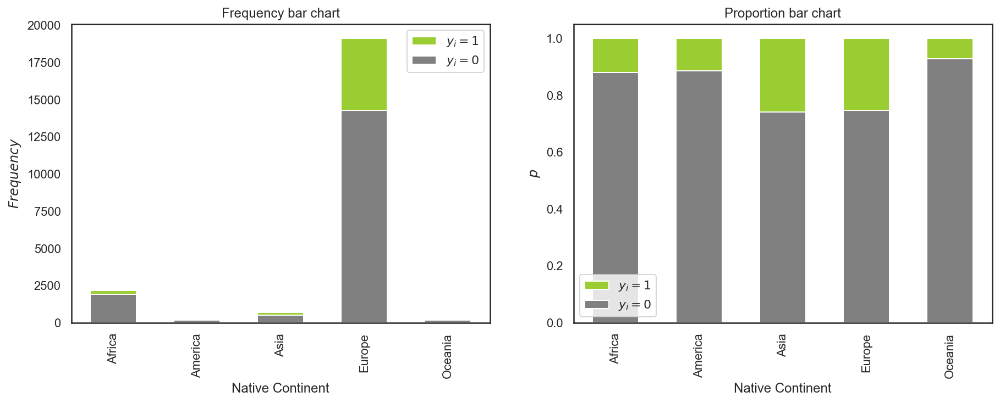

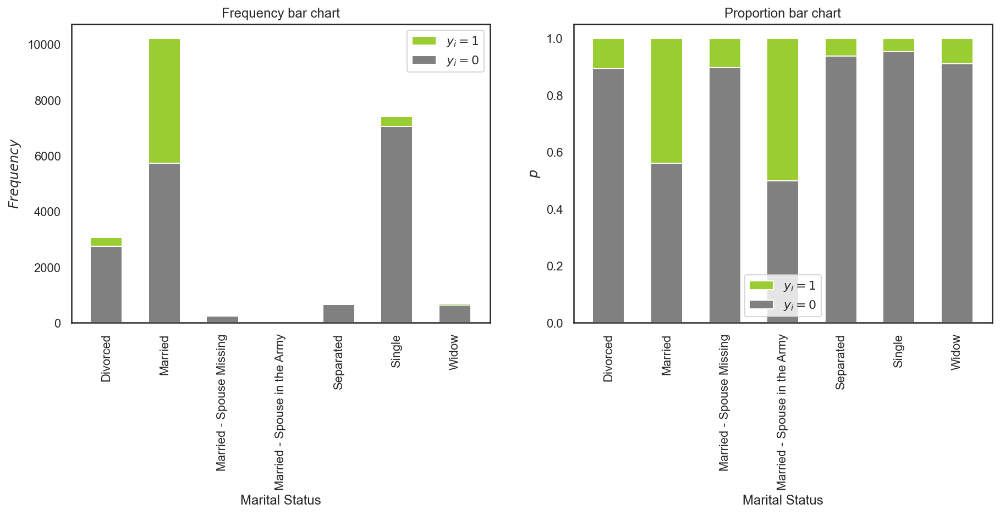

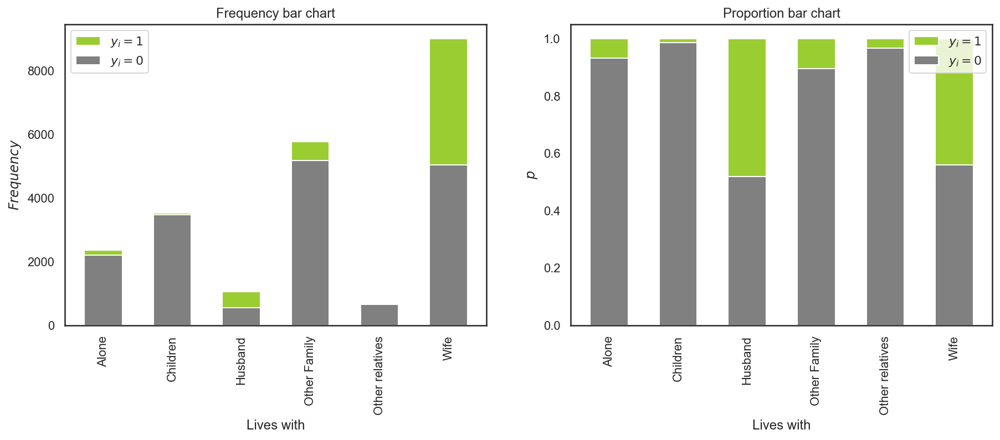

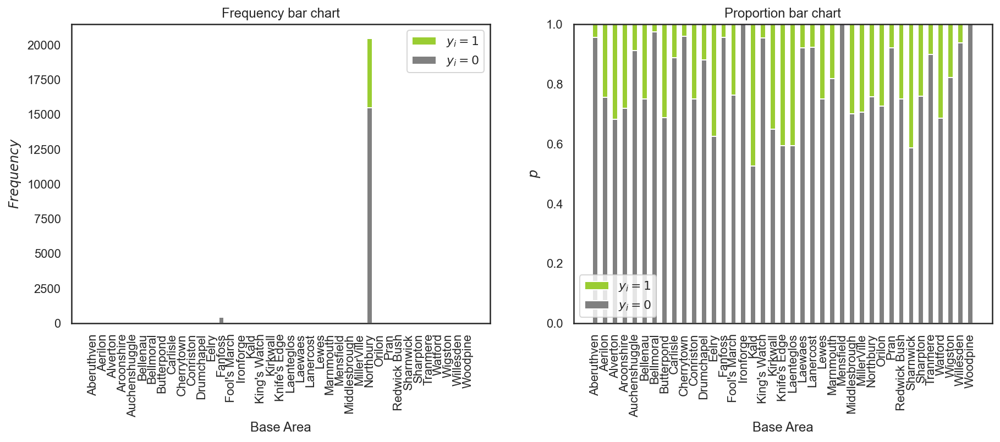

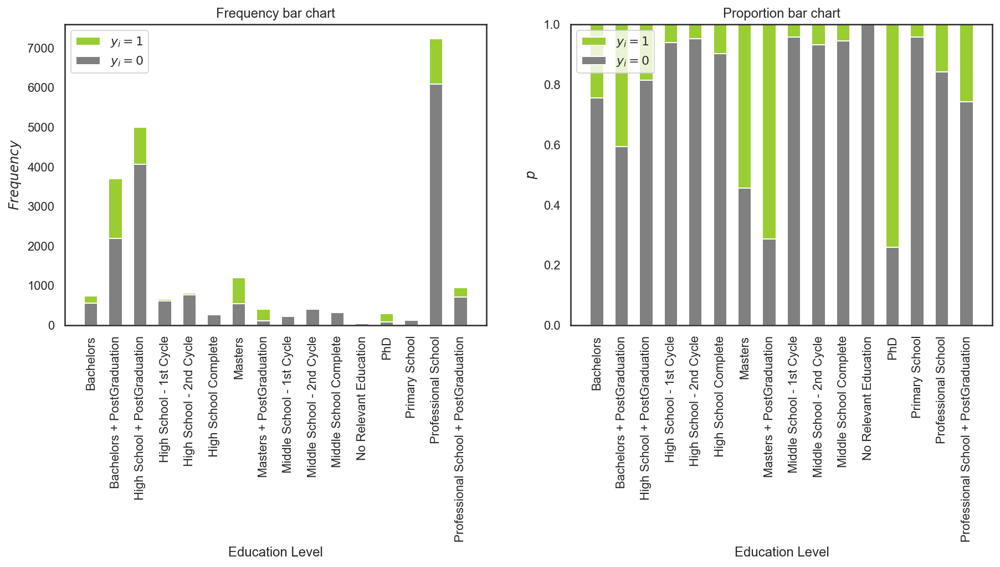

...

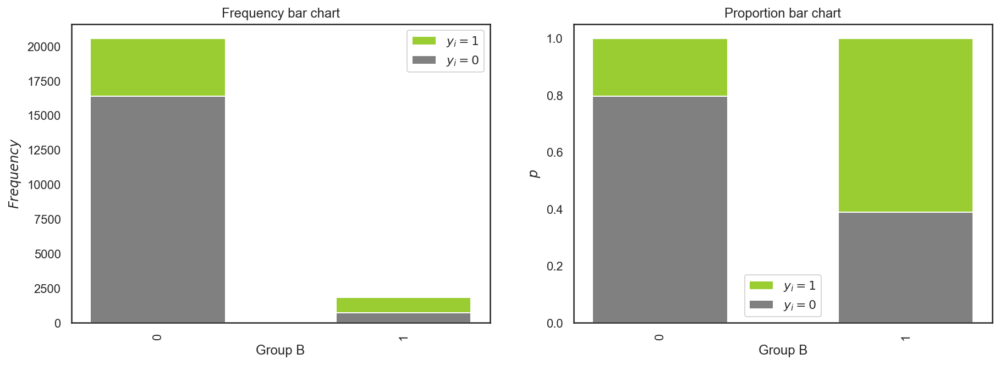

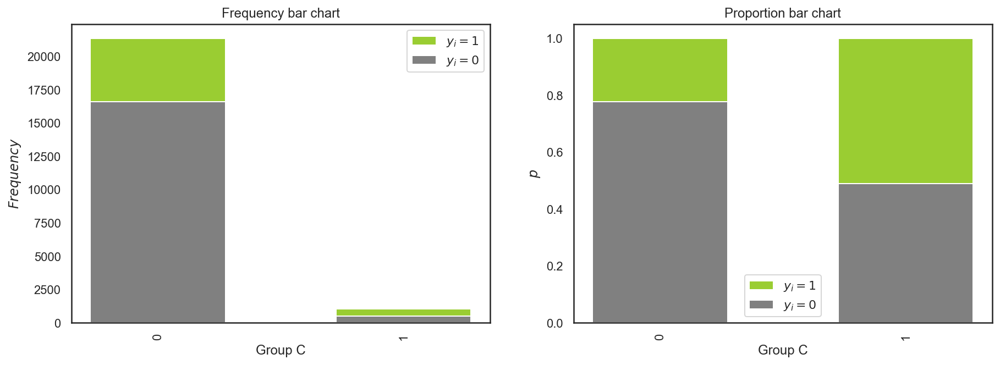

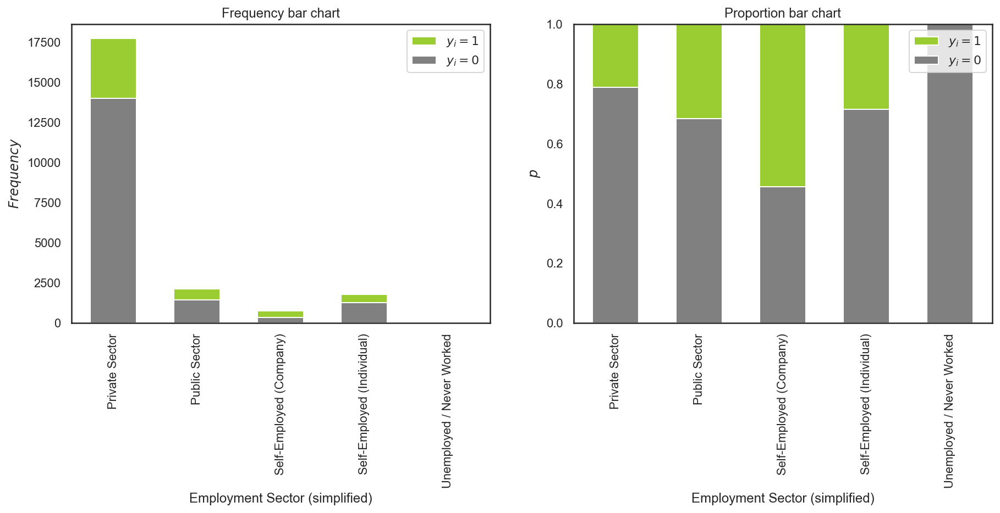

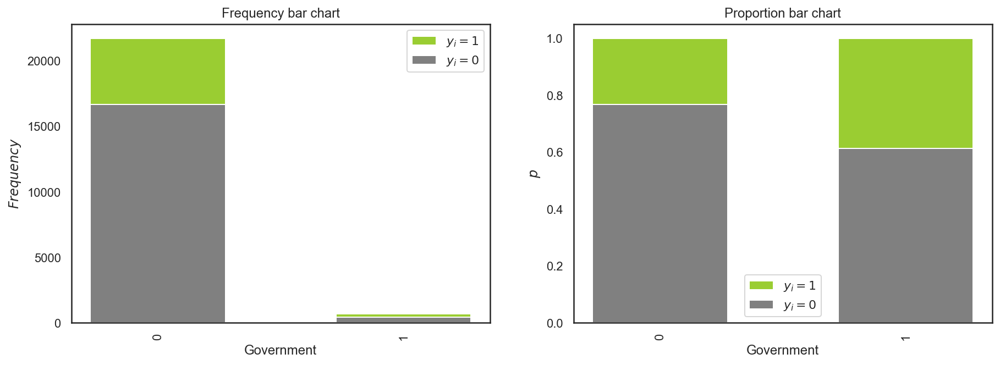

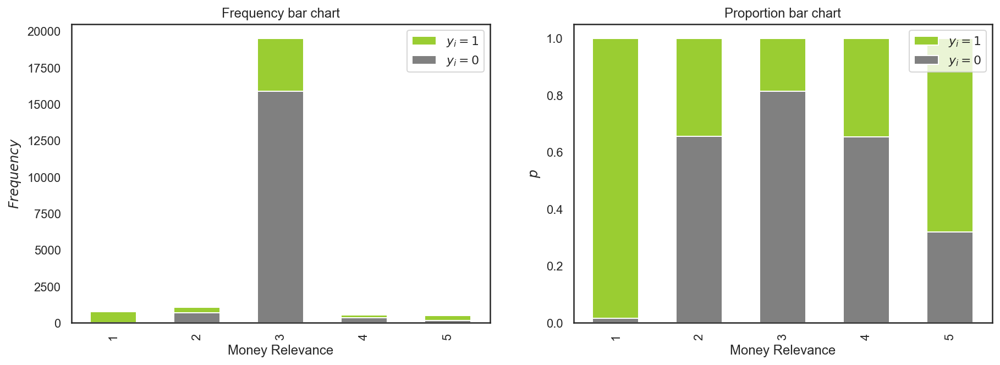

In [116]:
initial_categorical_features = initial_categorical_vars.columns

for i in initial_categorical_features:
    bar_charts_categorical(initial_categorical_vars, i, target)

In [117]:
#por exemplo nas variáveis da Education Level, do Marital Status e assim, há variáveis que são demasiado redundantes entre
#elas, por isso temos de escolher só uma (aquela que distingue melhor os 0s e 1s?)

#as melhores variáveis categ. parecem ser:
#uma das que são do Marital Status
#Lives With é boa, mas parece redudante com as de Marital Status (pq as pessoas que moram com o marido ou a mulher é q tão com 1s) -> mantemos o marital status
#Base Area? fica? por agora não...
#uma das que são do Education Level (a última?)
#uma das que são do Employment Sector?
#Male
#Group B e C!
#Money Relevance

In [118]:
#Binary features that will be droped:
# Base Area
# Lives with

#All these vars will be dropped bc they are too redundant with others:
# Marital Status
# Is Married
# Education Level
# PostGraduation
# Education Level_new
# Employment Sector

df_features = initial_categorical_vars.drop(columns=['Marital Status', 'Is Married', 'Lives with', 'Base Area', 'Education Level', 'Education Level_new', 'Employment Sector'])
df_features.head()
#now, the one hot encoding ->

,Native Continent,Role,Male,Marital Status_new,Education Level_new2,PostGraduation,Higher Education,Capital,Group B,Group C,Employment Sector (simplified),Government,Money Relevance
CITIZEN_ID,,,,,,,,,,,,,
12486,Europe,Repair & constructions,1,Married,High School,1,1,1,0,1,Private Sector,0,4
12487,Europe,Repair & constructions,1,Married,Professional School,0,0,1,0,0,Public Sector,0,3
12488,Europe,Sales,1,Married,Professional School,0,0,1,0,1,Private Sector,0,4
12489,Europe,Security,1,Married,High School,0,0,1,1,0,Private Sector,0,2
12490,Europe,Professor,1,Single,PhD,0,1,1,0,0,Self-Employed (Individual),0,3


### Encoding

In [119]:
pd.set_option('display.max_columns', None)

df_ohc = df_features.drop(columns=['Male', 'Higher Education', 'Capital', 'Group B', 'Group C', 'PostGraduation','Government']).copy()

# Use OneHotEncoder to encode the categorical features. Get feature names and create a DataFrame
# with the one-hot encoded categorical features (pass feature names)
ohc = OneHotEncoder(sparse=False, dtype=int) #MUDAR os x1_ pelo nome da variável???
ohc_feat = ohc.fit_transform(df_ohc)
ohc_feat_names = ohc.get_feature_names()
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)
ohc_df

,x0_Africa,x0_America,x0_Asia,x0_Europe,x0_Oceania,x1_Administratives,x1_Agriculture and Fishing,x1_Army,x1_Cleaners & Handlers,x1_Household Services,x1_IT,x1_Machine Operators & Inspectors,x1_Management,x1_No Role,x1_Other services,x1_Professor,x1_Repair & constructions,x1_Sales,x1_Security,x1_Transports,x2_Divorced or Separated,x2_Married,x2_Single,x2_Widow,x3_Bachelors,x3_High School,x3_Masters,x3_Middle School,x3_No Relevant Education,x3_PhD,x3_Primary School,x3_Professional School,x4_Private Sector,x4_Public Sector,x4_Self-Employed (Company),x4_Self-Employed (Individual),x4_Unemployed / Never Worked,x5_1,x5_2,x5_3,x5_4,x5_5
CITIZEN_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
12486,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
12487,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0
12488,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0
12489,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
12490,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34881,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0
34882,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0
34883,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0


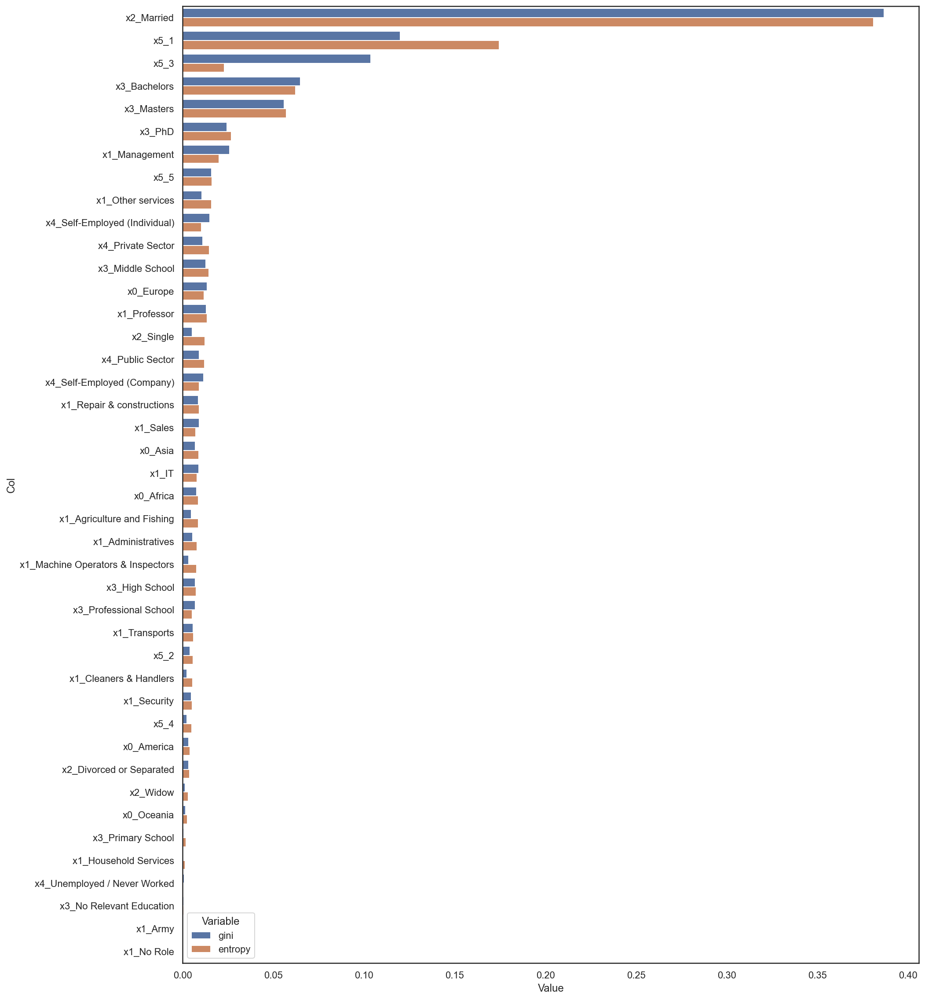

In [120]:
#feature importance with all binaries to check the classes with the lowest feature importance on each categorical

#feature importance using the split criteria 'Gini'
gini_importance = DecisionTreeClassifier().fit(ohc_df, target).feature_importances_

#feature importance using the split criteria 'Entropy'
entropy_importance = DecisionTreeClassifier(criterion='entropy').fit(ohc_df, target).feature_importances_

#plotting the feature importances for both criteria
zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini','entropy'])
zippy['col'] = ohc_df.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,20))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

In [121]:
#instead of dropping the first, we drop the less "important" according to frquency and proportion charts,
#and we also checked which class had less feature importance on each categorical feature
ohc_df.drop(columns=['x0_Oceania', 'x1_No Role', 'x2_Widow', 'x3_No Relevant Education', 'x4_Unemployed / Never Worked', 'x5_4'], inplace=True)

In [122]:
# Reassigning df to contain ohc variables
non_metric_binary = pd.concat([df_features.drop(columns=df_ohc.columns), ohc_df], axis=1)
non_metric_binary.head()

,Male,PostGraduation,Higher Education,Capital,Group B,Group C,Government,x0_Africa,x0_America,x0_Asia,x0_Europe,x1_Administratives,x1_Agriculture and Fishing,x1_Army,x1_Cleaners & Handlers,x1_Household Services,x1_IT,x1_Machine Operators & Inspectors,x1_Management,x1_Other services,x1_Professor,x1_Repair & constructions,x1_Sales,x1_Security,x1_Transports,x2_Divorced or Separated,x2_Married,x2_Single,x3_Bachelors,x3_High School,x3_Masters,x3_Middle School,x3_PhD,x3_Primary School,x3_Professional School,x4_Private Sector,x4_Public Sector,x4_Self-Employed (Company),x4_Self-Employed (Individual),x5_1,x5_2,x5_3,x5_5
CITIZEN_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
12486,1,1,1,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
12487,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0
12488,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
12489,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
12490,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0


In [123]:
non_metric_binary.loc[:, np.array(non_metric_binary.dtypes=="object")] = non_metric_binary.loc[:, np.array(non_metric_binary.dtypes=="object")].astype(int)

In [124]:
all_variables = pd.concat([non_metric_binary, stand_metric], axis=1)
all_variables.head()

,Male,PostGraduation,Higher Education,Capital,Group B,Group C,Government,x0_Africa,x0_America,x0_Asia,x0_Europe,x1_Administratives,x1_Agriculture and Fishing,x1_Army,x1_Cleaners & Handlers,x1_Household Services,x1_IT,x1_Machine Operators & Inspectors,x1_Management,x1_Other services,x1_Professor,x1_Repair & constructions,x1_Sales,x1_Security,x1_Transports,x2_Divorced or Separated,x2_Married,x2_Single,x3_Bachelors,x3_High School,x3_Masters,x3_Middle School,x3_PhD,x3_Primary School,x3_Professional School,x4_Private Sector,x4_Public Sector,x4_Self-Employed (Company),x4_Self-Employed (Individual),x5_1,x5_2,x5_3,x5_5,Years of Education,Working Hours per week,Money Received,Ticket Price,Age,Working hours * Years of Education,Money / YE,Log 10 of Money Received,Log 10 of Ticket Price
CITIZEN_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
12486,1,1,1,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0.619048,0.404040,0.000000,0.424225,0.383562,0.250120,0.000000,0.000000,0.900133
12487,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0.571429,0.404040,0.000000,0.000000,0.342466,0.230880,0.000000,0.000000,0.000000
12488,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0.571429,0.464646,0.000000,0.433184,0.301370,0.265512,0.000000,0.000000,0.902567
12489,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0.523810,0.373737,0.043862,0.000000,0.630137,0.195767,0.039874,0.733215,0.000000
12490,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1.000000,0.454545,0.000000,0.000000,0.219178,0.454545,0.000000,0.000000,0.000000


### With decision trees

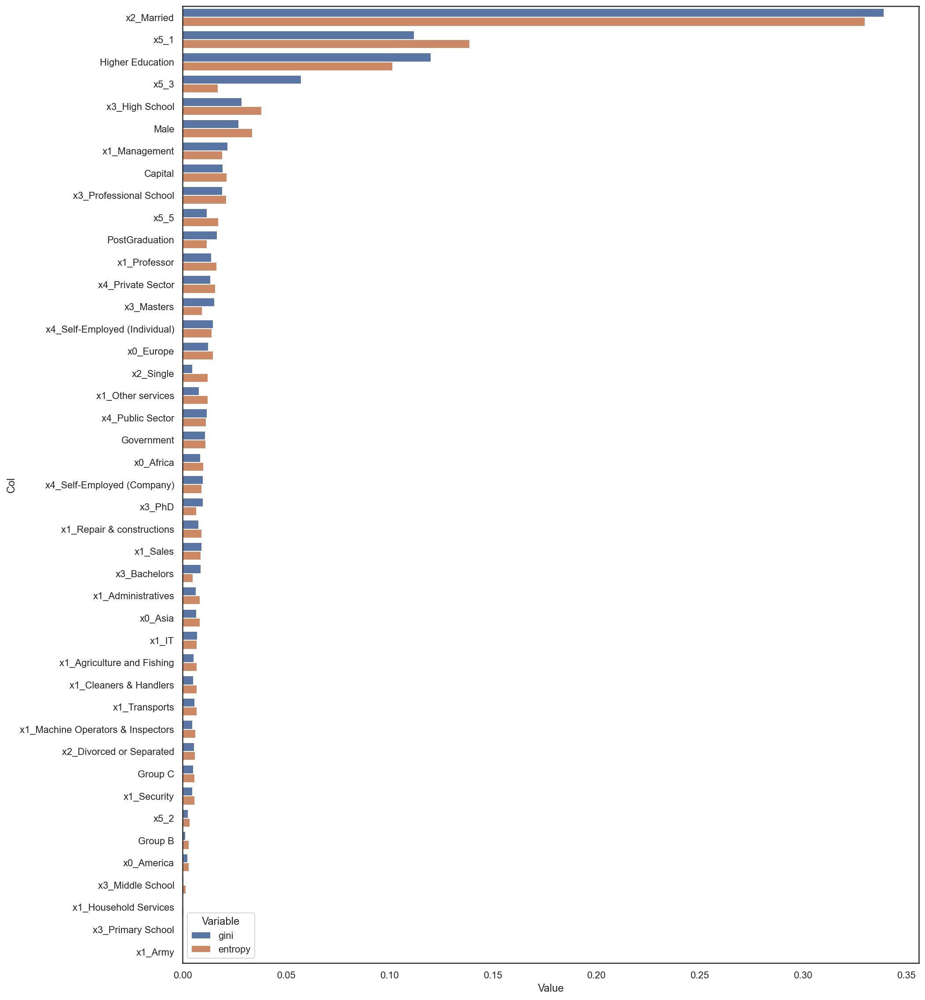

In [125]:
#feature importance using the split criteria 'Gini'
gini_importance = DecisionTreeClassifier().fit(non_metric_binary, target).feature_importances_

#feature importance using the split criteria 'Entropy'
entropy_importance = DecisionTreeClassifier(criterion='entropy').fit(non_metric_binary, target).feature_importances_

#plotting the feature importances for both criteria
zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini','entropy'])
zippy['col'] = non_metric_binary.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,20))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

#1. x2_Married
#2. x5_1
#3. Higher Education
#4. x5_3
#5. x3_High School
#6. Male
#7. x1_Management
#8. x3_Professional School
#9. Capital
#10. x5_5
#11. x4_Private Sector
#12. PostGraduation
#13. x0_Europe

### With Random Forest

In [126]:
#random forest instance, indicating the number of trees
rf = RandomForestClassifier(n_estimators = 100, random_state=0, n_jobs=-1)

sel = SelectFromModel(rf)

#selectFromModel object from sklearn to automatically select the features.
sel.fit(non_metric_binary, target)

#features with an importance greater than the mean importance of all the features
sel.get_support()

array([ True,  True,  True, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False,  True, False, False, False, False,  True,  True,
        True,  True, False,  True, False, False, False, False, False,
       False, False, False,  True, False,  True, False])

In [127]:
rf.fit(non_metric_binary, target)

df_imp = pd.DataFrame(rf.feature_importances_, non_metric_binary.columns).reset_index().rename(columns={'index':'binary_variables', 0:'feature_importance'})
df_imp.sort_values('feature_importance', ascending=False)

#1. x2_Married
#2. x5_1
#3. x2_Single
#4. x5_3
#5. Male
#6. Higher Education
#7. x3_Masters
#8. x1_Professor
#9. Group B
#10. PostGraduation
#11. x2_Divorced or Separated
#12. x3_Bachelors
#13. Capital

,binary_variables,feature_importance
26,x2_Married,0.172748
39,x5_1,0.086201
27,x2_Single,0.077245
41,x5_3,0.053724
0,Male,0.045061
2,Higher Education,0.044542
18,x1_Management,0.036859
30,x3_Masters,0.034417
20,x1_Professor,0.029395
4,Group B,0.029395


In [128]:
#get the selected features on a list and count them
selected_feat = non_metric_binary.columns[(sel.get_support())]
len(selected_feat)

13

In [129]:
#names
print(selected_feat)

#estes estão por ordem de importância em cima!

Index(['Male', 'PostGraduation', 'Higher Education', 'Group B',
       'x1_Management', 'x1_Professor', 'x2_Divorced or Separated',
       'x2_Married', 'x2_Single', 'x3_Bachelors', 'x3_Masters', 'x5_1',
       'x5_3'],
      dtype='object')


Fazer teste de chi quadrado para a independência entre as categóricas e a target

In [130]:
df_features_target=df_features.copy()
df_features_target["Target"]=target
df_features_target

,Native Continent,Role,Male,Marital Status_new,Education Level_new2,PostGraduation,Higher Education,Capital,Group B,Group C,Employment Sector (simplified),Government,Money Relevance,Target
CITIZEN_ID,,,,,,,,,,,,,,
12486,Europe,Repair & constructions,1,Married,High School,1,1,1,0,1,Private Sector,0,4,1
12487,Europe,Repair & constructions,1,Married,Professional School,0,0,1,0,0,Public Sector,0,3,1
12488,Europe,Sales,1,Married,Professional School,0,0,1,0,1,Private Sector,0,4,1
12489,Europe,Security,1,Married,High School,0,0,1,1,0,Private Sector,0,2,1
12490,Europe,Professor,1,Single,PhD,0,1,1,0,0,Self-Employed (Individual),0,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34881,Europe,Cleaners & Handlers,0,Divorced or Separated,Professional School,0,0,1,0,0,Private Sector,0,3,0
34882,Europe,Other services,1,Single,Professional School,0,0,1,0,0,Private Sector,0,3,0
34883,Europe,Professor,0,Single,Masters,0,1,1,1,0,Public Sector,0,2,0


In [131]:
df_features.head(3)

,Native Continent,Role,Male,Marital Status_new,Education Level_new2,PostGraduation,Higher Education,Capital,Group B,Group C,Employment Sector (simplified),Government,Money Relevance
CITIZEN_ID,,,,,,,,,,,,,
12486,Europe,Repair & constructions,1,Married,High School,1,1,1,0,1,Private Sector,0,4
12487,Europe,Repair & constructions,1,Married,Professional School,0,0,1,0,0,Public Sector,0,3
12488,Europe,Sales,1,Married,Professional School,0,0,1,0,1,Private Sector,0,4


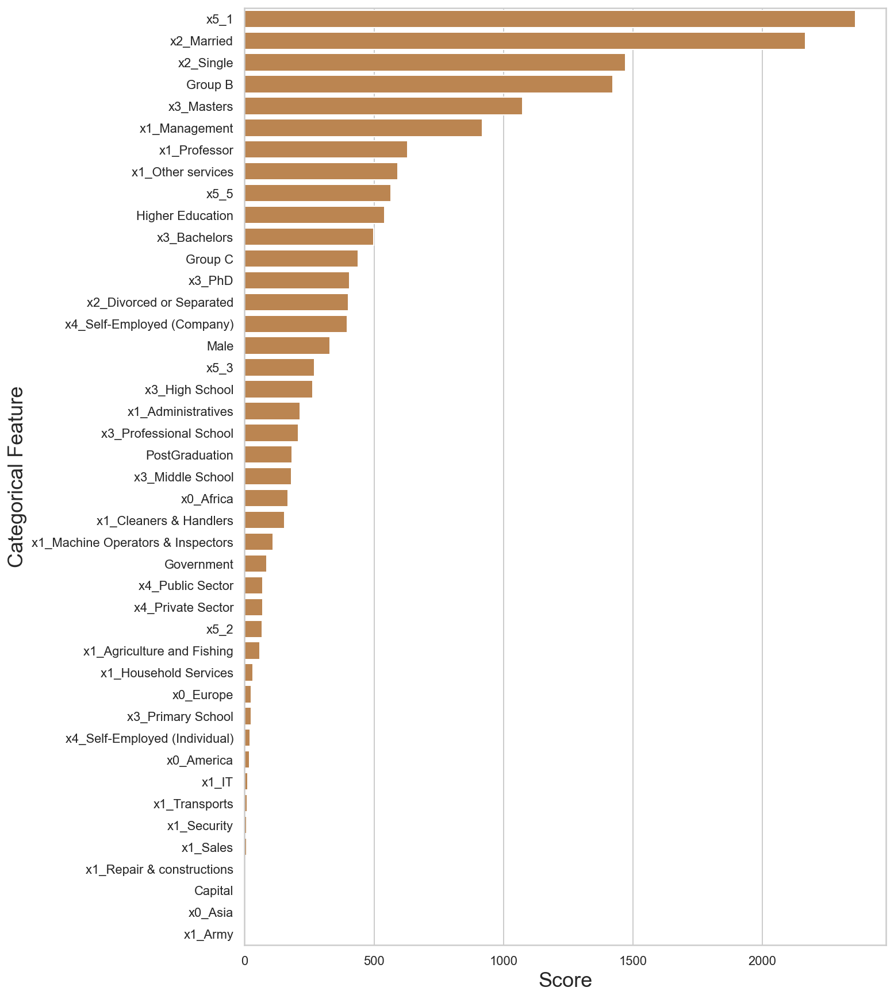

In [160]:
from sklearn.feature_selection import SelectKBest, chi2 # for chi-squared feature selection

sf = SelectKBest(chi2, k='all')
sf_fit = sf.fit(non_metric_binary, target)

#for i in range(len(sf_fit.scores_)):
#    print(' %s: %f' % (X.columns[i], sf_fit.scores_[i]))
    
# plot the scores
datset = pd.DataFrame()
datset['feature'] = non_metric_binary.columns[ range(len(sf_fit.scores_))]
datset['scores'] = sf_fit.scores_
datset = datset.sort_values(by='scores', ascending=False)

plt.figure(figsize=(10,15))
sns.barplot(datset['scores'], datset['feature'], color='peru')
sns.set_style('whitegrid')
plt.ylabel('Categorical Feature', fontsize=18)
plt.xlabel('Score', fontsize=18)
plt.show()

#valores mais altos= maior importancia/relevancia p a variavel dependente

In [133]:
#MI
from sklearn.feature_selection import mutual_info_classif

feat = []
mi = []

for i in non_metric_binary.columns:
    feat.append(i)
    
    a = np.array(non_metric_binary[i])
    b = np.array(target)

    #mutual information of 0.69, expressed in nats
    mi.append(mutual_info_classif(a.reshape(-1,1), b, discrete_features = True)[0])

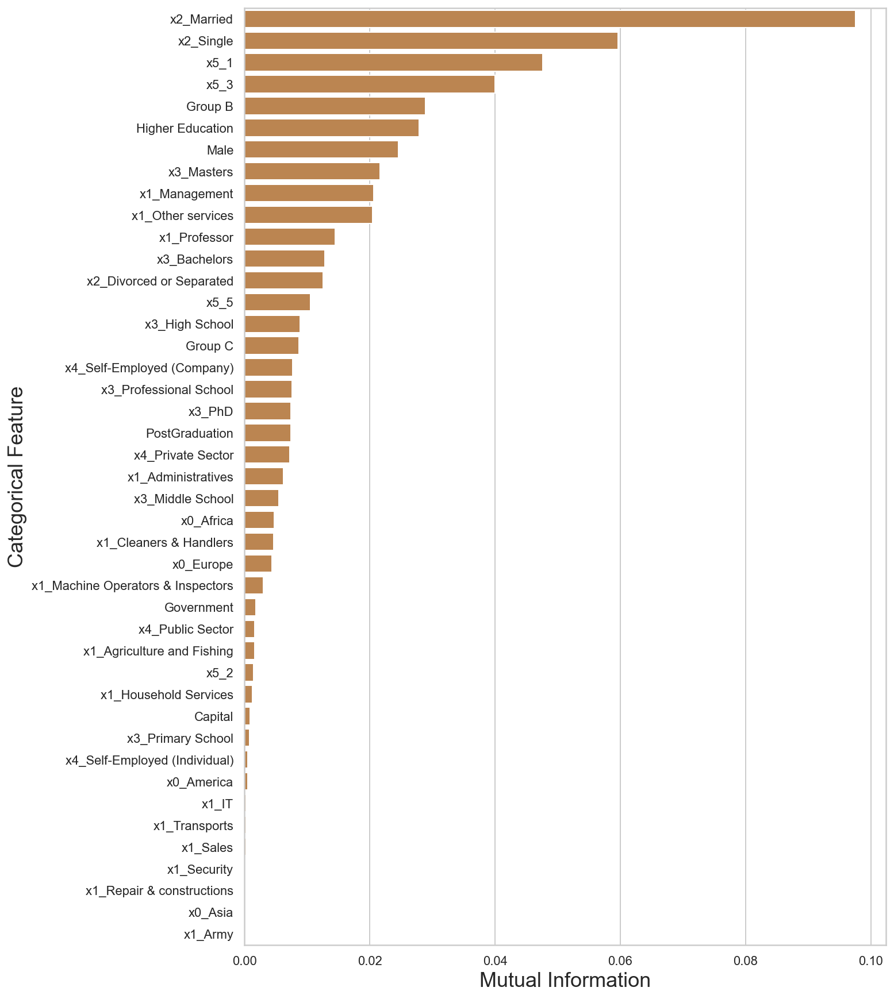

In [134]:
# plot the MI
feat_mi=pd.DataFrame([feat, mi]).T.sort_values(by=1, ascending=False).reset_index(drop=True)

plt.figure(figsize=(10,15))
sns.barplot(x=1, y=0, data=feat_mi, color='peru')
sns.set_style('whitegrid')
plt.ylabel('Categorical Feature', fontsize=18)
plt.xlabel('Mutual Information', fontsize=18)
plt.show()

### Mutual information among binary variables

In [135]:
non_metric_selected = non_metric_binary[['Male', 'Higher Education', 'Group B', 'x1_Management', 'x1_Professor', 'x2_Married', 'x2_Single', 'x3_Bachelors', 'x3_Masters', 'x5_1', 'x5_3', 'x5_5']]

In [136]:
from sklearn.metrics.cluster import normalized_mutual_info_score

print('Normalized mutual information between binary variables (0-1):\n')
for i in non_metric_selected.columns:
    for j in non_metric_selected.columns:
        normal_mi = round(normalized_mutual_info_score(non_metric_selected[i], non_metric_selected[j]), 3)
        
        if i == j: #equals to 1
            pass
        
        elif normal_mi > 0.5:
            print(i, 'and', j, ':', normal_mi)
            
#x3_3 was selected more times than Group B, so we will keep Group x3_3:
non_metric_selected.drop(columns='Group B', inplace=True)

Normalized mutual information between binary variables (0-1):

Group B and x5_3 : 0.594
x5_3 and Group B : 0.594


### Mixing numerical and categorical variables on a Forward and a Backward Feature Selection

In [137]:
stand_metric.drop(columns=['Working Hours per week', 'Money / YE', 'Log 10 of Money Received', 'Log 10 of Ticket Price'], inplace=True)

In [138]:
all_selected_variables = pd.concat([non_metric_selected, stand_metric], axis=1)

In [139]:
all_selected_variables

,Male,Higher Education,x1_Management,x1_Professor,x2_Married,x2_Single,x3_Bachelors,x3_Masters,x5_1,x5_3,x5_5,Years of Education,Money Received,Ticket Price,Age,Working hours * Years of Education
CITIZEN_ID,,,,,,,,,,,,,,,,
12486,1,1,0,0,1,0,0,0,0,0,0,0.619048,0.000000,0.424225,0.383562,0.250120
12487,1,0,0,0,1,0,0,0,0,1,0,0.571429,0.000000,0.000000,0.342466,0.230880
12488,1,0,0,0,1,0,0,0,0,0,0,0.571429,0.000000,0.433184,0.301370,0.265512
12489,1,0,0,0,1,0,0,0,0,0,0,0.523810,0.043862,0.000000,0.630137,0.195767
12490,1,1,0,1,0,1,0,0,0,1,0,1.000000,0.000000,0.000000,0.219178,0.454545
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34881,0,0,0,0,0,0,0,0,0,1,0,0.571429,0.000000,0.000000,0.109589,0.230880
34882,1,0,0,0,0,1,0,0,0,1,0,0.571429,0.000000,0.000000,0.082192,0.202020
34883,0,1,0,1,0,1,0,1,0,0,0,0.809524,0.021740,0.000000,0.123288,0.327080


In [140]:
model = LogisticRegression()

Forward:

In [141]:
forward = SFS(model, k_features=16, forward=True, scoring="accuracy", cv = None) #floating=False

forward.fit(all_selected_variables, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(),
                          k_features=16, scoring='accuracy')

In [142]:
forward_table = pd.DataFrame.from_dict(forward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
forward_table

,feature_idx,avg_score,feature_names
1,"(12,)",0.803259,"(Money Received,)"
2,"(12, 13)",0.816741,"(Money Received, Ticket Price)"
3,"(10, 12, 13)",0.811652,"(x5_5, Money Received, Ticket Price)"
4,"(5, 10, 12, 13)",0.812054,"(x2_Single, x5_5, Money Received, Ticket Price)"
5,"(5, 10, 11, 12, 13)",0.818304,"(x2_Single, x5_5, Years of Education, Money Re..."
6,"(4, 5, 10, 11, 12, 13)",0.835179,"(x2_Married, x2_Single, x5_5, Years of Educati..."
7,"(2, 4, 5, 10, 11, 12, 13)",0.838973,"(x1_Management, x2_Married, x2_Single, x5_5, Y..."
8,"(2, 4, 5, 8, 10, 11, 12, 13)",0.840268,"(x1_Management, x2_Married, x2_Single, x5_1, x..."
9,"(2, 4, 5, 8, 10, 11, 12, 13, 14)",0.842098,"(x1_Management, x2_Married, x2_Single, x5_1, x..."
10,"(2, 4, 5, 8, 9, 10, 11, 12, 13, 14)",0.842589,"(x1_Management, x2_Married, x2_Single, x5_1, x..."


In [143]:
forward_table_max = forward_table['avg_score'].max()
forward_table_max

0.8435267857142857

In [144]:
forward_table[forward_table['avg_score']==forward_table_max]['feature_names'].values

array([('Male', 'x1_Management', 'x1_Professor', 'x2_Married', 'x2_Single', 'x5_1', 'x5_3', 'x5_5', 'Years of Education', 'Money Received', 'Ticket Price', 'Age', 'Working hours * Years of Education')],
      dtype=object)

Backward

In [145]:
backward = SFS(model, k_features=1, forward=False, scoring="accuracy", cv = None) #floating=False

backward.fit(all_selected_variables, target)

SequentialFeatureSelector(cv=None, estimator=LogisticRegression(),
                          forward=False, scoring='accuracy')

In [146]:
backward_table = pd.DataFrame.from_dict(backward.get_metric_dict()).T.drop(columns=['cv_scores', 'ci_bound', 'std_dev', 'std_err'])
backward_table

,feature_idx,avg_score,feature_names
16,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.842946,"(Male, Higher Education, x1_Management, x1_Pro..."
15,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14,...",0.843884,"(Male, Higher Education, x1_Management, x1_Pro..."
14,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 11, 12, 13, 14, 15)",0.844018,"(Male, Higher Education, x1_Management, x1_Pro..."
13,"(0, 1, 2, 3, 4, 7, 8, 9, 11, 12, 13, 14, 15)",0.843973,"(Male, Higher Education, x1_Management, x1_Pro..."
12,"(1, 2, 3, 4, 7, 8, 9, 11, 12, 13, 14, 15)",0.843795,"(Higher Education, x1_Management, x1_Professor..."
11,"(1, 2, 3, 4, 8, 9, 11, 12, 13, 14, 15)",0.843929,"(Higher Education, x1_Management, x1_Professor..."
10,"(1, 2, 3, 4, 8, 9, 11, 13, 14, 15)",0.843393,"(Higher Education, x1_Management, x1_Professor..."
9,"(1, 2, 3, 4, 8, 9, 11, 14, 15)",0.842768,"(Higher Education, x1_Management, x1_Professor..."
8,"(1, 2, 3, 4, 8, 9, 11, 15)",0.842455,"(Higher Education, x1_Management, x1_Professor..."
7,"(2, 3, 4, 8, 9, 11, 15)",0.841875,"(x1_Management, x1_Professor, x2_Married, x5_1..."


In [147]:
backward_table_max = backward_table['avg_score'].max()
backward_table_max

0.8440178571428572

In [148]:
backward_table[backward_table['avg_score']==backward_table_max]['feature_names'].values

array([('Male', 'Higher Education', 'x1_Management', 'x1_Professor', 'x2_Married', 'x2_Single', 'x3_Masters', 'x5_1', 'x5_3', 'Years of Education', 'Money Received', 'Ticket Price', 'Age', 'Working hours * Years of Education')],
      dtype=object)

Mantaining the variables that appear on both the forward and backward selections:

In [149]:
non_metric_bf = non_metric_selected.drop(columns=['Higher Education', 'x3_Bachelors', 'x3_Masters', 'x5_5'])

In [150]:
all_selected_variables.drop(columns=['Higher Education', 'x3_Bachelors', 'x3_Masters', 'x5_5'], inplace=True)

### Checking point biserial among the selected numerical and categorical variables

In [151]:
from scipy.stats import pointbiserialr

print('Point biserial between binary and metric variables:\n')
for i in non_metric_bf.columns:
    for j in stand_metric.columns:
        pb = pointbiserialr(non_metric_bf[i], stand_metric[j])
        
        if abs(pb[0]) > 0.5:
            print(i, 'and', j, ':', round(pb[0], 3))

Point biserial between binary and metric variables:

x2_Single and Age : -0.536
x5_1 and Money Received : 0.619
x5_3 and Ticket Price : -0.567


## Data Partition

In [152]:
#o que acham? kfold vale a pena, fazer as funções e assim?

In [153]:
X_train, X_val, y_train, y_val = train_test_split(all_selected_variables,
                                                  target,
                                                  test_size = 0.3,
                                                  random_state = 42,
                                                  shuffle=True,
                                                  stratify=target)

# Predictive Modelling

In [151]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix #confusion_matrix to evaluate the accuracy of a classification 
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
import time
from sklearn.model_selection import KFold
from sklearn.tree import export_graphviz
import graphviz
import pydotplus
from sklearn.metrics import auc
from sklearn.metrics import roc_curve

def metrics(y_train, pred_train , y_val, pred_val):
    print('_____________________________________')
    print('                                                     TRAIN                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_train, pred_train))
    print(confusion_matrix(y_train, pred_train)) #true neg and true pos, false positives and false neg
    print('__________________________+_________')
    print('                                                VALIDATION                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_val, pred_val))
    print(confusion_matrix(y_val, pred_val))

## Decision Trees

In [182]:
def avg_score(model):
    # apply kfold
    kf = KFold(n_splits=10)
    # create lists to store the results from the different models 
    score_train = []
    score_val = []
    timer = []
    n_iter = []
    for train_index, val_index in kf.split(all_selected_variables):
        # get the indexes of the observations assigned for each partition
        X_train, X_val = all_selected_variables.iloc[train_index], all_selected_variables.iloc[val_index]
        y_train, y_val = target.iloc[train_index], target.iloc[val_index]
        # start counting time
        begin = time.perf_counter()
        # fit the model to the data
        model.fit(X_train, y_train)
        # finish counting time
        end = time.perf_counter()
        # check the mean accuracy for the train
        value_train = model.score(X_train, y_train)
        # check the mean accuracy for the validation
        value_val = model.score(X_val,y_val)
        # append the accuracies, the time and the number of iterations in the corresponding list
        score_train.append(value_train)
        score_val.append(value_val)
        timer.append(end-begin)
        #n_iter.append(model.n_iter_)
    # calculate the average and the std for each measure (accuracy, time and number of iterations)
    avg_time = round(np.mean(timer),3)
    avg_train = round(np.mean(score_train),3)
    avg_val = round(np.mean(score_val),3)
    std_time = round(np.std(timer),2)
    std_train = round(np.std(score_train),2)
    std_val = round(np.std(score_val),2)
    #avg_iter = round(np.mean(n_iter),1)
    #std_iter = round(np.std(n_iter),1)
    
    return str(avg_time) + '+/-' + str(std_time), str(avg_train) + '+/-' + str(std_train),\
str(avg_val) + '+/-' + str(std_val)
#, str(avg_iter) + '+/-' + str(std_iter)

In [155]:
def show_results(df, *args):
    """
    Receive an empty dataframe and the different models and call the function avg_score
    """
    count = 0
    # for each model passed as argument
    for arg in args:
        # obtain the results provided by avg_score
        time, avg_train, avg_val = avg_score(arg)
        # store the results in the right row
        df.iloc[count] = time, avg_train, avg_val
        count+=1
    return df

In [154]:
def plot_tree(model_tree):
    dot_data = export_graphviz(model_tree,
                               feature_names=X_train.columns,  
                               class_names=["Income lower or equal to avg", "Income higher than avg"],
                               filled=True)
    pydot_graph = pydotplus.graph_from_dot_data(dot_data)
    pydot_graph.set_size('"20,20"')
    return graphviz.Source(pydot_graph.to_string())

In [156]:
#AUC
def calculate_AUC(interval, x_train, x_val, y_train, y_val, parameter, max_depth = None):
    train_results = []
    val_results = []
    for value in interval:
        if (parameter == 'max_depth'):          
            dt = DecisionTreeClassifier(max_depth = value, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'max_features'):  
            dt = DecisionTreeClassifier(max_features = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_samples_split'):  
            dt = DecisionTreeClassifier(min_samples_split = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_samples_leaf'):  
            dt = DecisionTreeClassifier(min_samples_leaf = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_weight_fraction_leaf'):  
            dt = DecisionTreeClassifier(min_weight_fraction_leaf = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_impurity_decrease'):  
            dt = DecisionTreeClassifier(min_impurity_decrease = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        train_pred = dt.predict(x_train)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        # Add auc score to previous train results
        train_results.append(roc_auc)
        y_pred = dt.predict(x_val)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_val, y_pred)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        # Add auc score to previous validation results
        val_results.append(roc_auc)
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best validation value is ',interval[value_val])
    

    import matplotlib.pyplot as plt
    from matplotlib.legend_handler import HandlerLine2D
    line1, = plt.plot(interval, train_results, 'b', label="Train AUC")
    line2, = plt.plot(interval, val_results, 'r', label="Validation AUC")
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("AUC score")
    plt.xlabel(str(parameter))
    plt.show()

The best train value is  15.0
The best validation value is  10.0


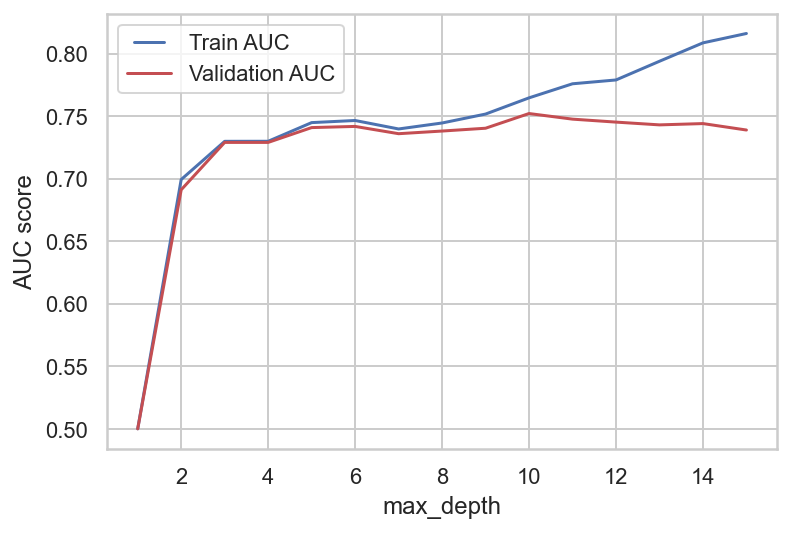

In [157]:
max_depths = np.linspace(1, 15, 15, endpoint=True)  
calculate_AUC(max_depths, X_train, X_val, y_train, y_val, 'max_depth')

The best train value is  6
The best validation value is  6


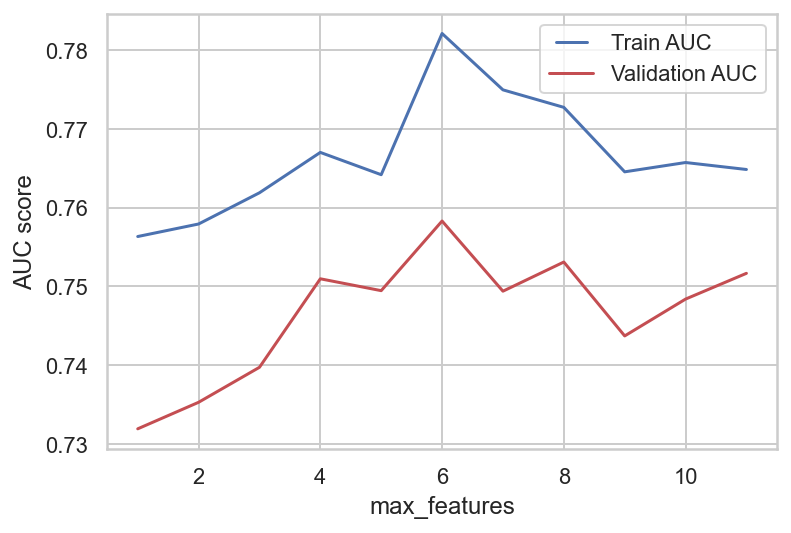

In [158]:
max_features = list(range(1,len(X_train.columns)))
calculate_AUC(max_features, X_train, X_val, y_train, y_val,'max_features', 10)

The best train value is  14
The best validation value is  17


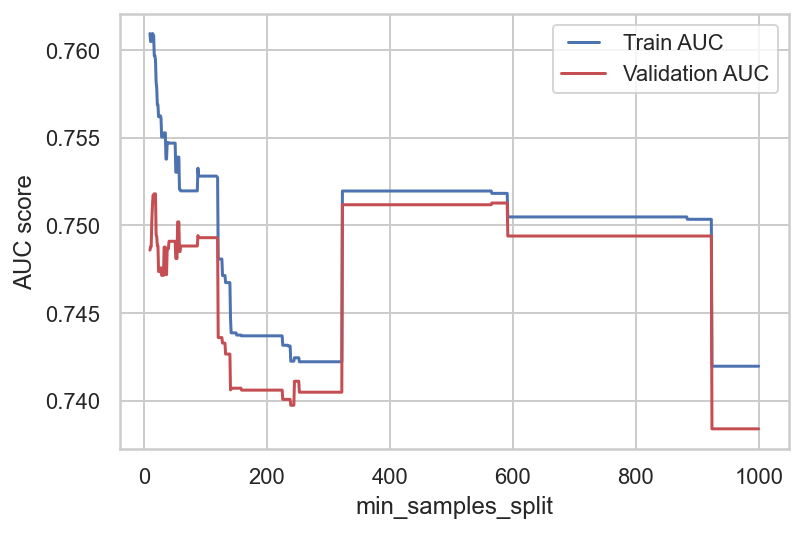

In [159]:
min_samples_split = list(range(10,1001))
calculate_AUC(min_samples_split, X_train, X_val, y_train, y_val,'min_samples_split', 10)

The best train value is  55
The best validation value is  38


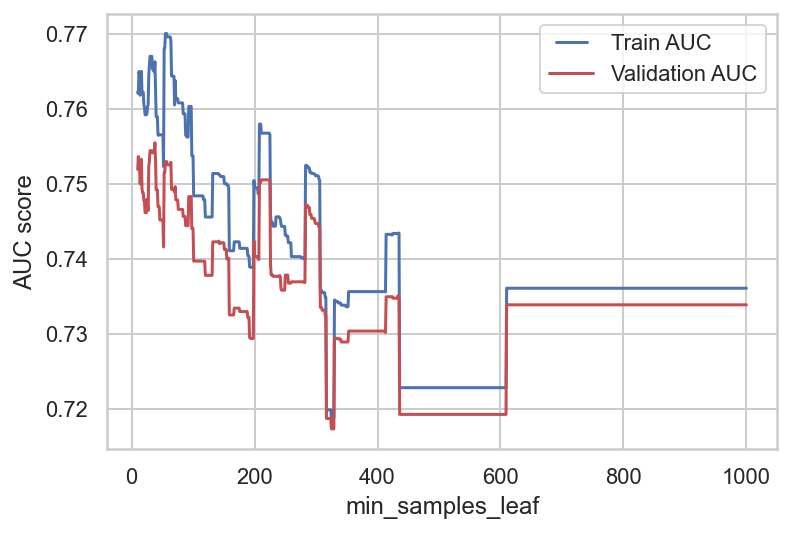

In [160]:
min_samples_leaf = list(range(10,1001))
calculate_AUC(min_samples_leaf, X_train, X_val, y_train, y_val,'min_samples_leaf', 10)

The best train value is  0.004016064257028112
The best validation value is  0.002008032128514056


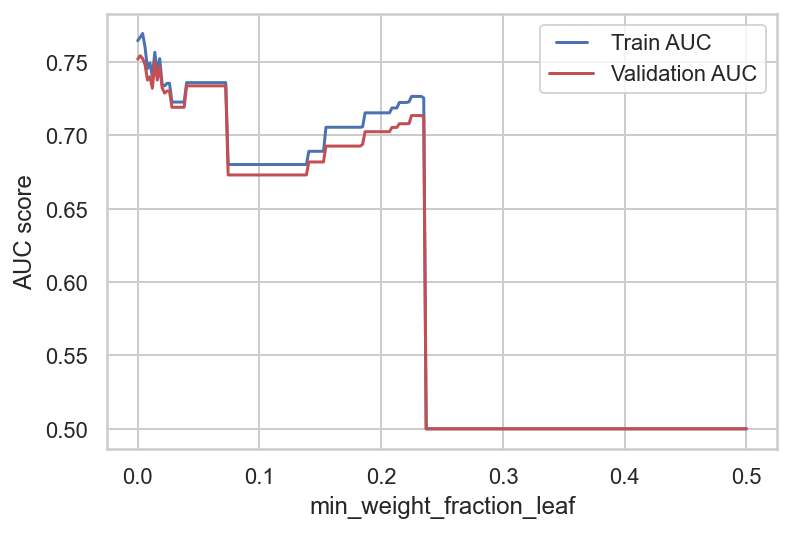

In [161]:
min_weight_fraction_leaf = np.linspace(0, 0.5, 250, endpoint=True)
calculate_AUC(min_weight_fraction_leaf, X_train, X_val, y_train, y_val,'min_weight_fraction_leaf', 10)

The best train value is  0.0
The best validation value is  0.0001002004008016032


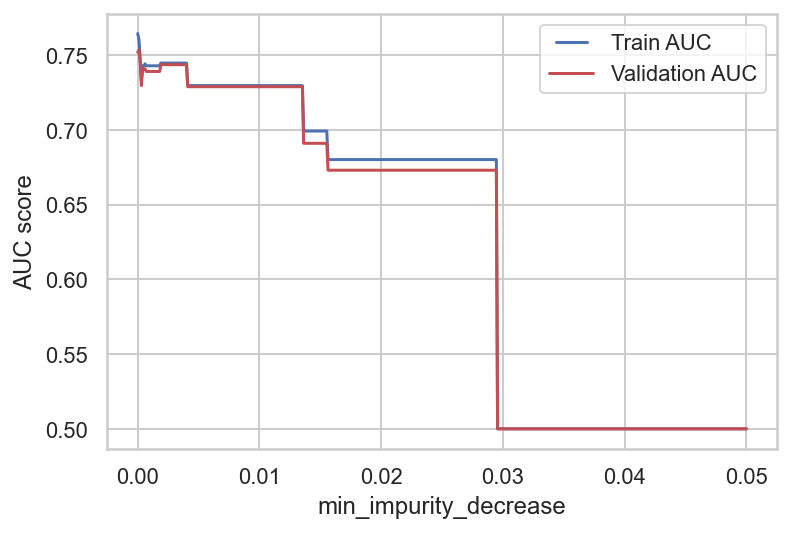

In [162]:
min_impurity_decrease = np.linspace(0, 0.05, 500, endpoint=True)
calculate_AUC(min_impurity_decrease, X_train, X_val, y_train, y_val,'min_impurity_decrease', 10)

In [163]:
#ccp_alpha
dt_alpha = DecisionTreeClassifier(random_state=42)
path = dt_alpha.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

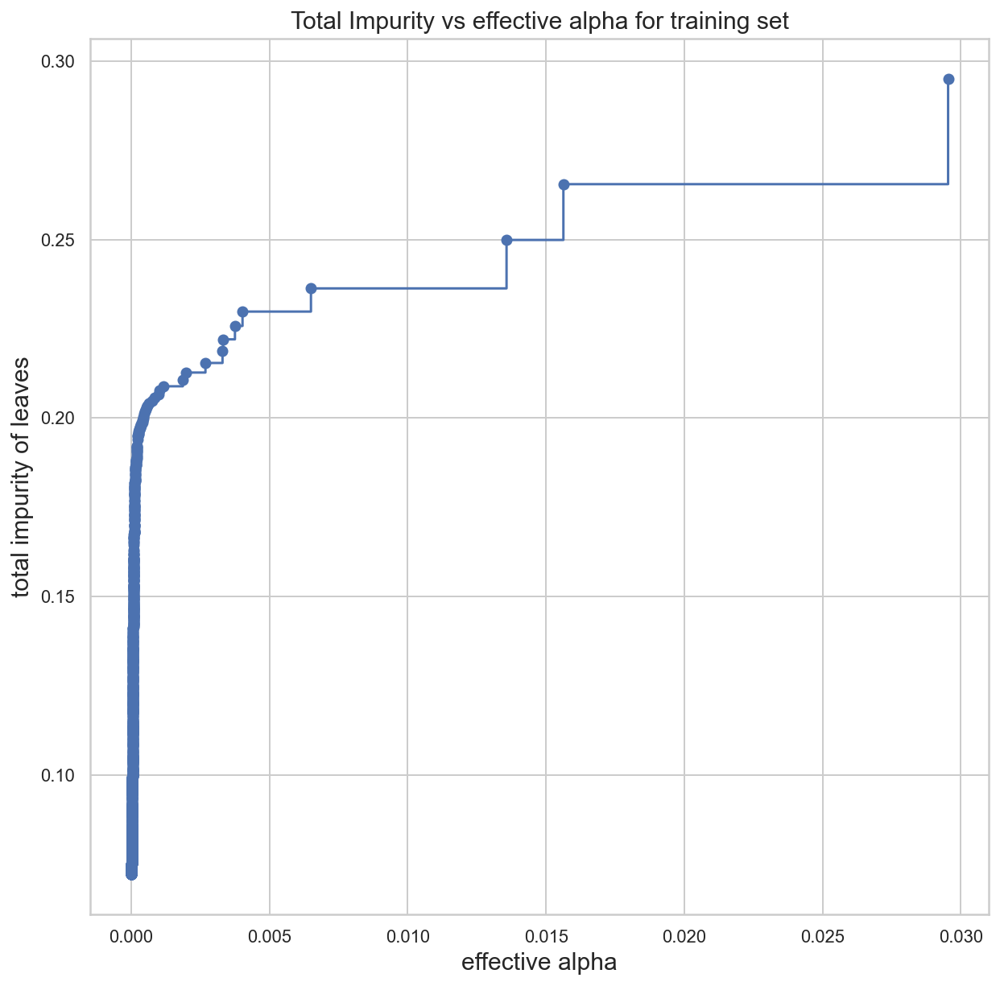

In [164]:
fig, ax = plt.subplots(figsize = (10,10))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha", fontsize=15)
ax.set_ylabel("total impurity of leaves", fontsize=15)
ax.set_title("Total Impurity vs effective alpha for training set", fontsize=15)

In [165]:
#a função abaixo não aceitava ccp_alphas menores que 0
ccp_alphas=ccp_alphas[ccp_alphas>0]

In [166]:
trees = []
for ccp_alpha in ccp_alphas:
    dt_alpha = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha).fit(X_train, y_train)
    trees.append(dt_alpha)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(trees[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.0667089762462657


In [167]:
trees = trees[:-1]
ccp_alphas = ccp_alphas[:-1]

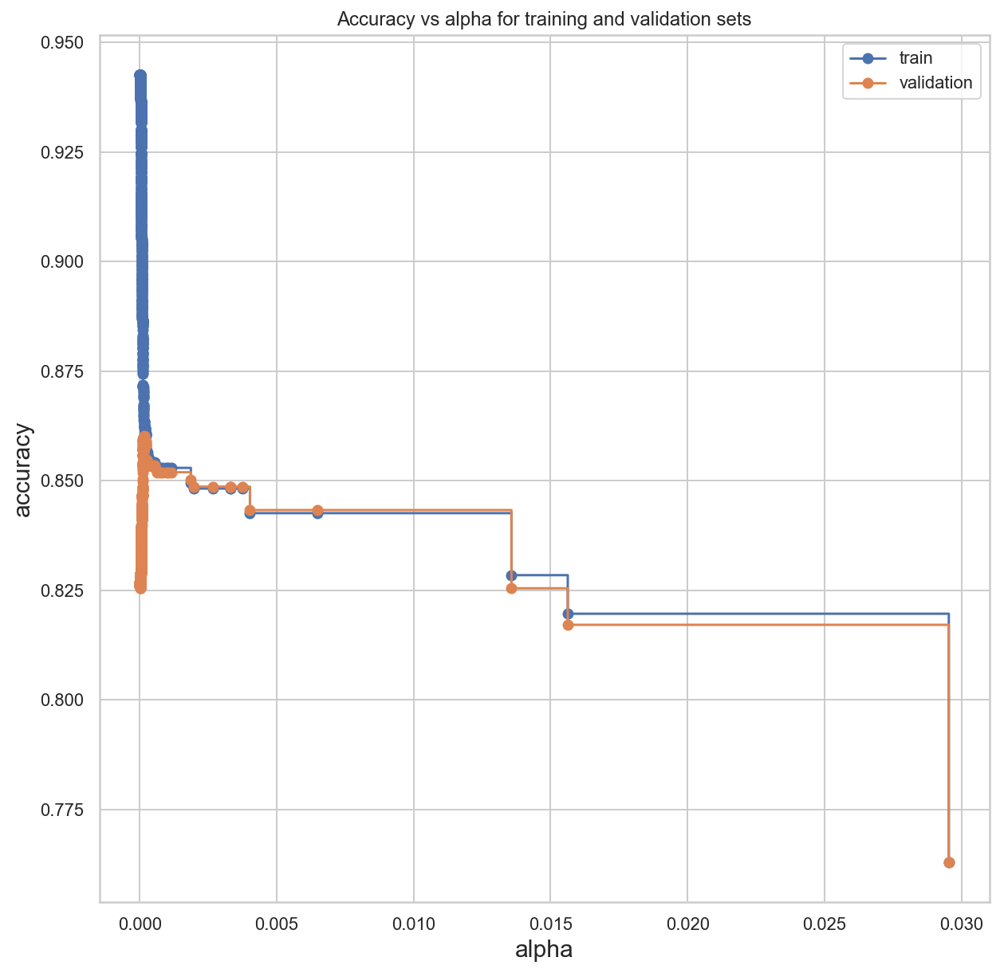

In [168]:
train_scores = [tree.score(X_train, y_train) for tree in trees]
val_scores = [tree.score(X_val, y_val) for tree in trees]

fig, ax = plt.subplots(figsize = (10,10))
ax.set_xlabel("alpha", fontsize=15)
ax.set_ylabel("accuracy", fontsize=15)
ax.set_title("Accuracy vs alpha for training and validation sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, val_scores, marker='o', label="validation", drawstyle="steps-post")
ax.legend()
plt.show()

In [169]:
index_best_model = np.argmax(val_scores)
best_model = trees[index_best_model]
print('ccp_alpha of best model: ',trees[index_best_model])
print('_____________________________________________________________')
print('Training accuracy of best model: ',best_model.score(X_train, y_train))
print('Validation accuracy of best model: ',best_model.score(X_val, y_val))

ccp_alpha of best model:  DecisionTreeClassifier(ccp_alpha=0.00015941340116873795, random_state=42)
_____________________________________________________________
Training accuracy of best model:  0.8626913265306122
Validation accuracy of best model:  0.8602678571428571


In [183]:
#Now, coding 4 decision trees:
dt_basic = DecisionTreeClassifier().fit(X_train, y_train)
dt_1 = DecisionTreeClassifier(min_samples_leaf=38).fit(X_train, y_train)
dt_2 = DecisionTreeClassifier(ccp_alpha=0.000159).fit(X_train, y_train)
dt_3 = DecisionTreeClassifier(max_depth=10, min_samples_leaf=38, min_samples_split=17).fit(X_train, y_train)
dt_4 = DecisionTreeClassifier(max_features=6, min_samples_split=17).fit(X_train, y_train)

In [184]:
df = pd.DataFrame(columns = ['Time','Train','Validation'], index = ['dt_basic','dt_1', 'dt_2', 'dt_3', 'dt_4'])
show_results(df, dt_basic, dt_1, dt_2, dt_3, dt_4)

,Time,Train,Validation
dt_basic,0.057+/-0.01,0.94+/-0.0,0.826+/-0.01
dt_1,0.041+/-0.01,0.861+/-0.0,0.852+/-0.01
dt_2,0.119+/-0.05,0.865+/-0.0,0.857+/-0.01
dt_3,0.059+/-0.02,0.859+/-0.0,0.853+/-0.01
dt_4,0.027+/-0.0,0.892+/-0.0,0.841+/-0.01


In [196]:
#changing the threshold improves or not the accuracy......?
threshold = 0.4

predicted_proba = dt_2.predict_proba(X_val)
predicted = (predicted_proba [:,1] >= threshold).astype('int')

accuracy = accuracy_score(y_val, predicted)
accuracy

0.8550595238095238

In [197]:
prob_model1 = dt_1.predict_proba(X_val)
prob_model2 = dt_2.predict_proba(X_val)
prob_model3 = dt_3.predict_proba(X_val)
prob_model4 = dt_4.predict_proba(X_val)

In [198]:
fpr_1, tpr_1, thresholds_1 = roc_curve(y_val, prob_model1[:, 1])
fpr_2, tpr_2, thresholds_2 = roc_curve(y_val, prob_model2[:, 1])
fpr_3, tpr_3, thresholds_3 = roc_curve(y_val, prob_model3[:, 1])
fpr_4, tpr_4, thresholds_4 = roc_curve(y_val, prob_model4[:, 1])

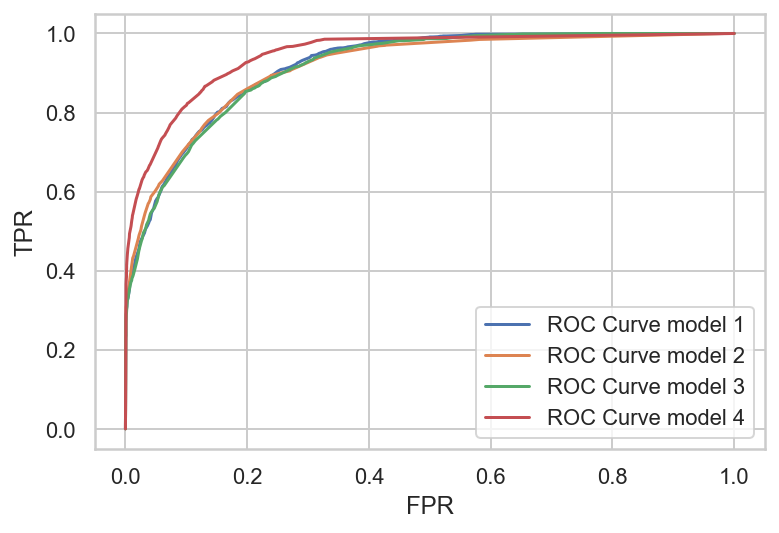

In [199]:
plt.plot(fpr_1, tpr_1, label="ROC Curve model 1")
plt.plot(fpr_2, tpr_2, label="ROC Curve model 2")
plt.plot(fpr_3, tpr_3, label="ROC Curve model 3")
plt.plot(fpr_4, tpr_4, label="ROC Curve model 4")
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()
plt.show()

# o modelo 4 parece melhor mas está apenas a usar os resultados dos 1's --> provavelmente é melhor a prever os 1, mas não os 0, 
# por isso no global é pior que o 2, porque a maior parte do dataset são 0 e não 1 (e o 2 é melhor a prever os 0)

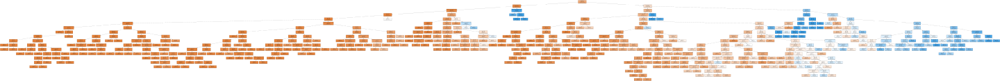

In [200]:
plot_tree(dt_1)

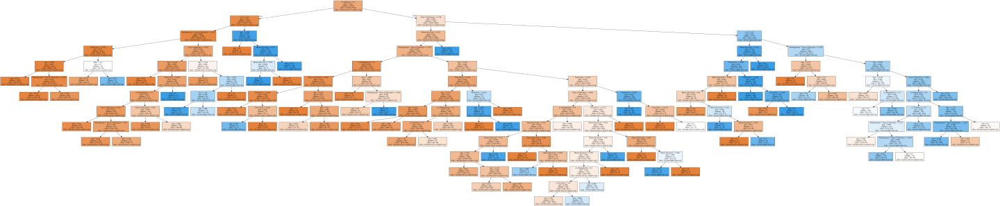

In [201]:
plot_tree(dt_2)

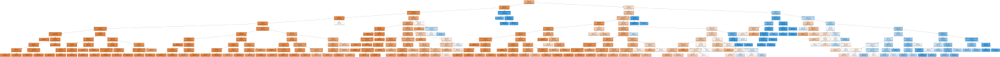

In [202]:
plot_tree(dt_3)

In [203]:
plot_tree(dt_4)

In [204]:
# dt_1.predict(X_val)
# dt_1.predict_proba(X_val)
print('The "best" three has a depth of ' + str(dt_2.get_depth()) + ', ' + str(dt_2.tree_.node_count) + 
       ' nodes and a total of ' + str(dt_2.get_n_leaves()) + ' leaves.')

The "best" three has a depth of 13, 161 nodes and a total of 81 leaves.


## Random Forests

In [205]:
random = 42

ensemble_clfs = [
    ("RandomForestClassifier, max_features='auto'",
        RandomForestClassifier(oob_score=True,
                               max_features='auto',
                               random_state=random)),
    ("RandomForestClassifier, max_features=6",
        RandomForestClassifier(max_features=6,
                               oob_score=True,
                               random_state=random)),
    ("RandomForestClassifier, max_features=None",
        RandomForestClassifier(max_features=None,
                               oob_score=True,
                               random_state=random))
]

In [206]:
from collections import OrderedDict

# Map a classifier name to a list of (<n_estimators>, <error rate>) pairs.
error_rate = OrderedDict((label, []) for label, _ in ensemble_clfs)

# Range of `n_estimators` values to explore.
min_estimators = 15
max_estimators = 175 #225

for label, clf in ensemble_clfs:
    for i in range(min_estimators, max_estimators + 1):
        clf.set_params(n_estimators=i)
        clf.fit(X_train, y_train)

        # Record the OOB error for each `n_estimators=i` setting.
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))

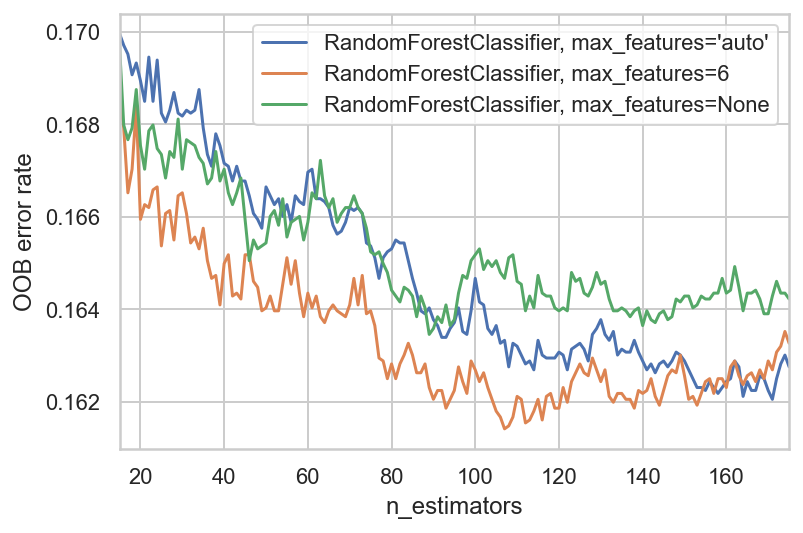

In [207]:
# Generate the "OOB error rate" vs. "n_estimators" plot.
for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    plt.plot(xs, ys, label=label)

plt.xlim(min_estimators, max_estimators)
plt.xlabel("n_estimators")
plt.ylabel("OOB error rate")
plt.legend(loc="upper right")
plt.show()

In [235]:
rf_1 = RandomForestClassifier(n_estimators=110, max_depth=10, random_state = 42)
rf_2 = RandomForestClassifier(n_estimators=110, max_depth=10, max_features = 6, random_state = 42)
rf_3 = RandomForestClassifier(n_estimators=110, max_depth=10, min_samples_split=17, random_state = 42)

In [236]:
rf_1.fit(X_train, y_train)
rf_2.fit(X_train, y_train)
rf_3.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, min_samples_split=17, n_estimators=110,
                       random_state=42)

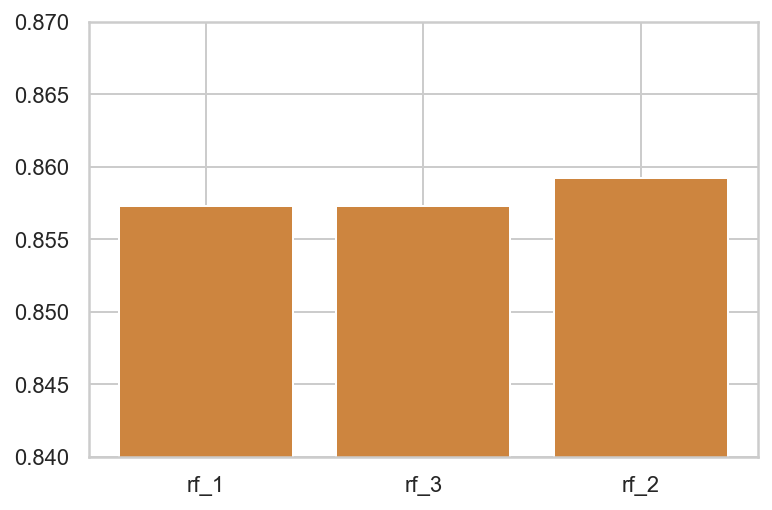

In [237]:
models = ['rf_1', 'rf_2', 'rf_3']

accuracies = [rf_1.score(X_val, y_val), rf_2.score(X_val, y_val), rf_3.score(X_val, y_val)]

data_tuples = list(zip(models,accuracies))

data = pd.DataFrame(data_tuples)
data = data.sort_values(1)

plt.bar(data[0], data[1], color='peru')
plt.ylim(0.84, 0.87)
plt.show()

In [238]:
#highest score
rf_2.score(X_val, y_val)

0.8592261904761904

In [244]:
#changing the threshold does not seem to improve the accuracy of the best random forest!
threshold = 0.4

predicted_proba = rf_2.predict_proba(X_val)
predicted = (predicted_proba [:,1] >= threshold).astype('int')

accuracy = accuracy_score(y_val, predicted)
accuracy

0.8555059523809524

## Logistic Regression

In [152]:
#importing and defining the model
log_model = LogisticRegression(random_state=4)

In [153]:
log_model.fit(X_train,y_train) #fit model to our train data

LogisticRegression(random_state=4)

In [154]:
labels_train = log_model.predict(X_train)
log_model.score(X_train, y_train)

0.8422831632653062

In [155]:
#Predict class labels for samples in X
labels_val = log_model.predict(X_val) 
labels_val
#predict values for X_test, ex: p o citizen em X_test [0] estamos a prever y[0]->0

array([0, 0, 1, ..., 0, 1, 0], dtype=int64)

In [156]:
pred_prob = log_model.predict_proba(X_val) 
pred_prob 
#o cutoff normalmente é de 0.5, mas as vezes é preferivel considerar menos

array([[0.77539968, 0.22460032],
       [0.98820754, 0.01179246],
       [0.48078694, 0.51921306],
       ...,
       [0.77977821, 0.22022179],
       [0.2111217 , 0.7888783 ],
       [0.92778066, 0.07221934]])

In [157]:
X_train.columns

Index(['Male', 'x1_Management', 'x1_Professor', 'x2_Married', 'x2_Single',
       'x5_1', 'x5_3', 'Years of Education', 'Money Received', 'Ticket Price',
       'Age', 'Working hours * Years of Education'],
      dtype='object')

In [158]:
log_model.coef_
#since we dont have the residuals, we cannot use the OLS, not applied to logistic regression
#c estes valores so conseguimos dizer q se for + a curva é p cima, - para baixo

array([[ 0.20713477,  0.79360677,  0.49667638,  2.15371552, -0.46836093,
         4.25245138, -0.42555478,  4.23855478,  2.37394443,  1.86944684,
         1.59418237,  4.05710623]])

In [163]:
#apagar
#from sklearn.metrics import accuracy_score
#from sklearn.metrics import precision_score #The best value is 1, and the worst value is 0
#from sklearn.metrics import f1_score #F1 score reaches its best value at 1 and worst score at 0

In [159]:
metrics(y_train, labels_train, y_val, labels_val)

#ability of the classifier to not label a sample as positive if it is negative
#recall: ability of the classifier to find all the positive samples
#bad model: from all the dataset, what are the ones we are getting right
#f1: weighted harmonic mean of the precision and recall

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90     11962
           1       0.73      0.53      0.62      3718

    accuracy                           0.84     15680
   macro avg       0.80      0.74      0.76     15680
weighted avg       0.83      0.84      0.83     15680

[[11225   737]
 [ 1736  1982]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      5127
           1       0.74   

## Gaussian Naive Bayes

In [172]:
#modelNB = GaussianNB() # train score: 0.8112 validation score: 0.8153
#modelNB = GaussianNB(var_smoothing=0.0001)  #train score: 0.8126 validation score: 0.8175
modelNB = GaussianNB(var_smoothing=0.001) # train score: 0.81996 validation score: 0.82425
modelNB.fit(X = X_train, y = y_train)
labels_train = modelNB.predict(X_train)
labels_val = modelNB.predict(X_val)
modelNB.predict_proba(X_val)

array([[9.99697778e-01, 3.02222484e-04],
       [9.99999301e-01, 6.98977699e-07],
       [8.15278926e-01, 1.84721074e-01],
       ...,
       [9.99936666e-01, 6.33343805e-05],
       [2.75805861e-01, 7.24194139e-01],
       [9.99962068e-01, 3.79321579e-05]])

In [173]:
print("train score:", modelNB.score(X_train, y_train))
print("validation score:",modelNB.score(X_val, y_val))

train score: 0.8199617346938776
validation score: 0.8242559523809524


In [174]:
# Para ver unbalancedness, média e variância para cada 
print(modelNB.class_prior_) #prob 0, prob 1
print(modelNB.class_count_)#n 0, n 1
modelNB.theta_
modelNB.sigma_

[0.76288265 0.23711735]
[11962.  3718.]


array([[0.23730401, 0.08135446, 0.0911708 , 0.22845336, 0.2426612 ,
        0.00116794, 0.06818955, 0.01276044, 0.00036502, 0.0055573 ,
        0.03713913, 0.00869138],
       [0.13098469, 0.19152316, 0.18619311, 0.1232465 , 0.06273552,
        0.11782212, 0.21295597, 0.01478259, 0.02277119, 0.01966069,
        0.02135461, 0.010448  ]])

In [175]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.83      0.95      0.89     11962
           1       0.72      0.39      0.51      3718

    accuracy                           0.82     15680
   macro avg       0.78      0.67      0.70     15680
weighted avg       0.81      0.82      0.80     15680

[[11393   569]
 [ 2254  1464]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.96      0.89      5127
           1       0.74   

## Neural Networks

In [176]:
model = MLPClassifier(random_state=4)
model.fit(X_train, y_train)
labels_train = model.predict(X_train)
labels_val = model.predict(X_val)

In [177]:
metrics(y_train, labels_train, y_val, labels_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.94      0.91     11962
           1       0.75      0.58      0.65      3718

    accuracy                           0.85     15680
   macro avg       0.81      0.76      0.78     15680
weighted avg       0.85      0.85      0.85     15680

[[11222   740]
 [ 1556  2162]]
__________________________+_________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      5127
           1       0.74   

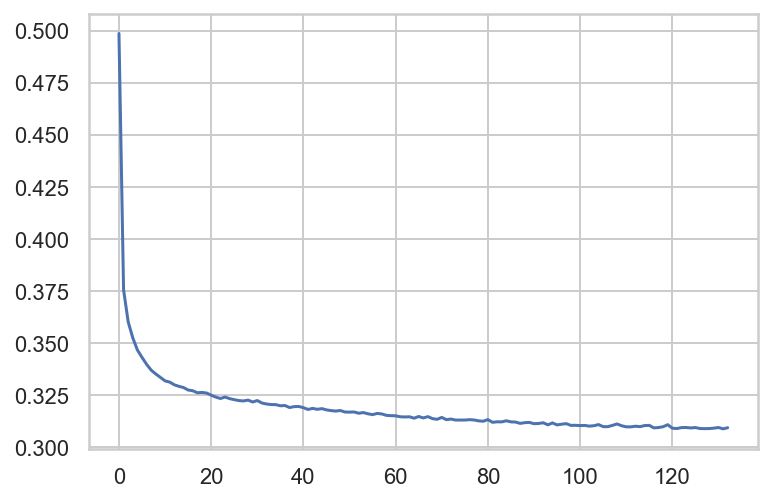

In [182]:
losses = model.loss_curve_
iterations = range(model.n_iter_)
sns.lineplot(iterations, losses)

In [183]:
model.loss_

0.3093838281848804

In [184]:
#Get the weight matrix by calling the attribute coefs_:
model.coefs_

[array([[ 0.25646729, -0.63401749,  0.15923207, ..., -0.10764884,
          0.06753643,  0.06529558],
        [ 0.01006874, -0.20436896,  0.02229392, ...,  0.11852186,
          0.17809397, -0.08013576],
        [ 0.01577975, -0.27577708,  0.11621795, ..., -0.15131821,
         -0.35718654, -0.0984025 ],
        ...,
        [ 0.32141626,  0.92994635, -0.14403291, ..., -0.1082877 ,
         -0.22757678,  0.17750133],
        [ 0.28459494, -0.07208455,  0.01594108, ..., -0.05227701,
         -0.07082839,  0.310179  ],
        [ 0.25554021, -0.61937804,  0.13594538, ..., -0.16914616,
         -0.61318537,  0.14896908]]),
 array([[ 2.28501845e-001],
        [-1.22755039e+000],
        [-5.45698636e-002],
        [ 7.04409023e-003],
        [-3.91754846e-001],
        [-1.65745031e+000],
        [-1.36756039e+000],
        [ 3.91167615e-001],
        [-1.48210704e+000],
        [-1.83154111e-001],
        [ 5.15863971e-001],
        [-1.80258165e+000],
        [-2.50564749e-001],
        [

In [185]:
#Get the bias vector by calling the attribute intercepts_:
model.intercepts_

[array([-0.13739982,  0.25667682, -0.03238431, -0.01212337,  0.39165126,
         0.37507084, -0.3569153 ,  0.00211703,  0.21492665,  0.2804885 ,
        -0.19359491,  0.61048665, -0.0486569 ,  0.024467  ,  0.24354064,
        -0.12514487,  0.32317156,  0.52404878, -0.01664451, -0.17858499,
        -0.52898502, -0.2231145 ,  0.25524124,  0.28627574,  0.1048285 ,
         0.45103374,  0.35687283, -0.14151121, -0.15744535, -0.03432837,
        -0.08853954, -0.22789648,  0.20612979,  0.31770883,  0.06561235,
        -0.2238011 , -0.236364  , -0.08343462,  0.22291593,  0.24838785,
        -0.169815  ,  0.31651534, -0.18826026,  0.36034269,  0.29337364,
        -0.34796567,  0.08364145,  0.21505852, -0.28623094,  0.10937755,
        -0.05969561,  0.31865907,  0.24976646, -0.23159916,  0.18295101,
        -0.13431071, -0.15929379, -0.22807766,  0.14670342,  0.49803981,
         0.2946897 ,  0.25928683,  0.37808881, -0.17757877, -0.15452682,
         0.24227067,  0.05908086, -0.16716631, -0.1

In [175]:
# Estamos a usar all_selected_variables min max 0 1. Podemos:
#testar min max -1 1
#testar all_selected_variables robust scaller

In [181]:
model = MLPClassifier(random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['Raw'])
show_results(df, model)

,Time,Train,Val,Iterations
Raw,20.237+/-2.57,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


In [189]:
model_1 = MLPClassifier(hidden_layer_sizes=(1),random_state=4)
model_2 = MLPClassifier(hidden_layer_sizes=(3),random_state=4)
model_3 = MLPClassifier(hidden_layer_sizes=(9),random_state=4)
model_4 = MLPClassifier(hidden_layer_sizes=(3, 3),random_state=4)
model_5 = MLPClassifier(hidden_layer_sizes=(5, 5),random_state=4)
model_6 = MLPClassifier(hidden_layer_sizes=(3, 3, 3),random_state=4) #3 layers each one with 3 units

In [190]:
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['M_1','M_2','M_3', 'M_4','M_5','M_6'])
show_results(df, model_1, model_2, model_3, model_4, model_5, model_6)

,Time,Train,Val,Iterations
M_1,3.916+/-0.22,0.843+/-0.0,0.843+/-0.01,139.0+/-5.7
M_2,3.94+/-0.43,0.844+/-0.0,0.844+/-0.01,123.3+/-13.8
M_3,4.535+/-0.55,0.846+/-0.0,0.847+/-0.01,126.2+/-13.5
M_4,7.552+/-0.6,0.846+/-0.0,0.846+/-0.01,175.3+/-12.8
M_5,9.747+/-0.87,0.85+/-0.0,0.848+/-0.01,193.1+/-11.3
M_6,8.23+/-1.6,0.848+/-0.0,0.847+/-0.01,149.4+/-30.5


In [191]:
model_7 = MLPClassifier(hidden_layer_sizes=(4, 4)+,random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['M_7'])
show_results(df, model_7)

,Time,Train,Val,Iterations
M_7,8.547+/-0.55,0.848+/-0.0,0.847+/-0.01,188.8+/-10.0


1, 5, 6, 7 -> overfitting
O melhor é o 3
Agora M5 também é muito bom mas um pitz de overfitting-> testar M_3, M_5 e depois M_6

In [192]:
model_logistic = MLPClassifier(activation = 'logistic',random_state=4)
model_tanh = MLPClassifier(activation = 'tanh',random_state=4)
model_relu=MLPClassifier(activation = 'relu',random_state=4)

In [193]:
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['logistic','tanh','relu'])
show_results(df, model_logistic, model_tanh,model_relu)

,Time,Train,Val,Iterations
logistic,7.009+/-0.87,0.844+/-0.0,0.843+/-0.01,71.1+/-6.5
tanh,22.838+/-0.82,0.85+/-0.0,0.849+/-0.01,200.0+/-0.0
relu,23.397+/-2.82,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


Logistic is better: same score in less iterations
Logistic has less overfitting than tanh, eventhough not significant

Logistic provides a nomalized output between 0 and 1
Logistic provides a nomalized output between -1 and 1

In [194]:
model_lbfgs = MLPClassifier(solver = 'lbfgs',random_state=4) #low dim and sparse data
model_sgd = MLPClassifier(solver = 'sgd',random_state=4) #accuracy > processing time
model_adam = MLPClassifier(solver = 'adam',random_state=4) # big dataset but might fail to converge

In [196]:
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['lbfgs','sgd','adam'])
show_results(df, model_lbfgs, model_sgd, model_adam)

,Time,Train,Val,Iterations
lbfgs,24.185+/-0.81,0.853+/-0.0,0.848+/-0.01,200.0+/-0.0
sgd,30.834+/-1.94,0.843+/-0.0,0.842+/-0.01,189.8+/-10.1
adam,24.194+/-3.53,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


Adam is the best however it has a little overfitting, therefore we will test adam and sgd (less overfitt)

In [197]:
model_constant = MLPClassifier(solver = 'sgd', learning_rate = 'constant',random_state=4)
model_invscaling = MLPClassifier(solver = 'sgd', learning_rate = 'invscaling',random_state=4)
model_adaptive = MLPClassifier(solver = 'sgd', learning_rate = 'adaptive',random_state=4)

In [198]:
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['constant','invscaling','adaptive'])
show_results(df, model_constant, model_invscaling, model_adaptive)

,Time,Train,Val,Iterations
constant,32.217+/-2.34,0.843+/-0.0,0.842+/-0.01,189.8+/-10.1
invscaling,3.437+/-0.3,0.763+/-0.0,0.763+/-0.01,20.0+/-0.0
adaptive,32.341+/-1.68,0.843+/-0.0,0.842+/-0.01,200.0+/-0.0


Constant is the better

In [199]:
model_a = MLPClassifier(solver = 'adam', learning_rate_init = 0.5,random_state=4) #qt maior mais rapido aprende o modelo
model_b = MLPClassifier(solver = 'adam', learning_rate_init = 0.1,random_state=4)
model_c = MLPClassifier(solver = 'adam', learning_rate_init = 0.01,random_state=4) #se for mt pequeno pode ficar preso numa solucao subotima e pode nunca convergir
model_d = MLPClassifier(solver = 'adam', learning_rate_init = 0.001,random_state=4)

In [200]:
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['M_a','M_b','M_c', "M_d"])
show_results(df, model_a, model_b, model_c, model_d)

,Time,Train,Val,Iterations
M_a,3.602+/-0.96,0.842+/-0.01,0.841+/-0.01,22.0+/-5.5
M_b,5.775+/-0.95,0.847+/-0.01,0.849+/-0.01,37.7+/-6.0
M_c,13.97+/-4.13,0.855+/-0.0,0.85+/-0.0,100.0+/-25.0
M_d,20.178+/-2.68,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


The best is 0.1(!!!!) or 0.01 so test

In [201]:
model_e = MLPClassifier(solver = 'adam', learning_rate_init = 0.005,random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ["M_e"])
show_results(df, model_e)

,Time,Train,Val,Iterations
M_e,18.101+/-4.15,0.856+/-0.0,0.852+/-0.01,120.1+/-28.1


In [202]:
model_batch20 = MLPClassifier(solver = 'sgd', batch_size = 20,random_state=4)
model_batch50 = MLPClassifier(solver = 'sgd', batch_size = 50,random_state=4)
model_batch100 = MLPClassifier(solver = 'sgd', batch_size = 100,random_state=4)
model_batch200 = MLPClassifier(solver = 'sgd', batch_size = 200,random_state=4)
model_batch500 = MLPClassifier(solver = 'sgd', batch_size = 500,random_state=4)

In [203]:
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['batch 20','batch 50','batch 100', 'batch 200', 'batch 500'])
show_results(df, model_batch20, model_batch50, model_batch100,  model_batch200, model_batch500)

,Time,Train,Val,Iterations
batch 20,60.46+/-2.85,0.848+/-0.0,0.846+/-0.01,193.9+/-9.8
batch 50,52.394+/-10.32,0.845+/-0.0,0.844+/-0.01,183.1+/-34.6
batch 100,27.726+/-1.79,0.844+/-0.0,0.843+/-0.01,151.3+/-7.7
batch 200,25.611+/-1.59,0.843+/-0.0,0.842+/-0.01,189.8+/-10.1
batch 500,20.813+/-0.49,0.838+/-0.0,0.837+/-0.01,200.0+/-0.0


The best one is batch 50

In [204]:
model_maxiter_50 = MLPClassifier(max_iter = 50,random_state=4)
model_maxiter_100 = MLPClassifier(max_iter = 100,random_state=4)
model_maxiter_200 = MLPClassifier(max_iter = 200,random_state=4)
model_maxiter_300 = MLPClassifier(max_iter = 300,random_state=4)

In [205]:
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['max iter 50','max iter 100','max iter 200', 'max iter 300'])
show_results(df, model_maxiter_50, model_maxiter_100, model_maxiter_200, model_maxiter_300)

,Time,Train,Val,Iterations
max iter 50,6.779+/-0.13,0.851+/-0.0,0.849+/-0.01,50.0+/-0.0
max iter 100,13.894+/-0.4,0.854+/-0.0,0.85+/-0.01,100.0+/-0.0
max iter 200,19.708+/-2.41,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3
max iter 300,19.896+/-2.42,0.855+/-0.0,0.85+/-0.01,142.9+/-17.3


In [206]:
model_maxiter_150 = MLPClassifier(max_iter = 150,random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['max iter 150'])
show_results(df, model_maxiter_150)

,Time,Train,Val,Iterations
max iter 150,19.374+/-2.42,0.854+/-0.0,0.85+/-0.01,138.6+/-13.2


In [207]:
model_all=MLPClassifier(hidden_layer_sizes=(9),activation = 'logistic',solver = 'adam',learning_rate_init = 0.1,batch_size = 50,random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['Raw'])
show_results(df, model_all)

,Time,Train,Val,Iterations
Raw,3.596+/-1.49,0.845+/-0.0,0.842+/-0.01,33.0+/-13.4


In [152]:
# parameter_space = {
#     'hidden_layer_sizes': [(9), (3,3)],
#     'activation': ['logistic'],
#     'solver': ['sgd', 'adam'],
#     'learning_rate_init': list(np.linspace(0.1,0.01)),
#     'batch_size': [(50),(100)], 
#     'max_iter': [(150),(100)],
# }

In [153]:
clf = GridSearchCV(model, parameter_space,n_jobs=-1)

In [154]:
clf.fit(X_train, y_train)

GridSearchCV(estimator=MLPClassifier(), n_jobs=-1,
             param_grid={'activation': ['logistic'], 'batch_size': [50, 100],
                         'hidden_layer_sizes': [9, (3, 3)],
                         'learning_rate_init': [0.1, 0.09816326530612246,
                                                0.0963265306122449,
                                                0.09448979591836736,
                                                0.0926530612244898,
                                                0.09081632653061225,
                                                0.0889795918367347,
                                                0.08714285714285715,
                                                0.0853061224489796,
                                                0.08346938775510204,
                                                0.081632...
                                                0.07244897959183674,
                                                0.0706122448

In [155]:
clf.best_params_

{'activation': 'logistic',
 'batch_size': 100,
 'hidden_layer_sizes': 9,
 'learning_rate_init': 0.02102040816326531,
 'max_iter': 150,
 'solver': 'adam'}

In [160]:
model_grid=model_all=MLPClassifier(activation= 'logistic', batch_size= 100, hidden_layer_sizes=(9), learning_rate_init= 0.02102040816326531, max_iter= 150, solver= 'adam',random_state=4)
df = pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['Raw'])
show_results(df, model_grid)

,Time,Train,Val,Iterations
Raw,6.953+/-0.97,0.851+/-0.0,0.842+/-0.01,71.6+/-10.3


In [156]:
# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'activation': 'logistic', 'batch_size': 100, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.02102040816326531, 'max_iter': 150, 'solver': 'adam'}
------------------------------------------------------------------------------------------------------------------------
0.842 (+/-0.007) for {'activation': 'logistic', 'batch_size': 50, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.1, 'max_iter': 150, 'solver': 'sgd'}
0.839 (+/-0.011) for {'activation': 'logistic', 'batch_size': 50, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.1, 'max_iter': 150, 'solver': 'adam'}
0.845 (+/-0.008) for {'activation': 'logistic', 'batch_size': 50, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.1, 'max_iter': 100, 'solver': 'sgd'}
0.841 (+/-0.010) for {'activation': 'logistic', 'batch_size': 50, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.1, 'max_iter'

0.841 (+/-0.007) for {'activation': 'logistic', 'batch_size': 100, 'hidden_layer_sizes': (3, 3), 'learning_rate_init': 0.01, 'max_iter': 100, 'solver': 'sgd'}
0.847 (+/-0.007) for {'activation': 'logistic', 'batch_size': 100, 'hidden_layer_sizes': (3, 3), 'learning_rate_init': 0.01, 'max_iter': 100, 'solver': 'adam'}


Com base na segunda escolha de parâmetros depois de definido o random_state

In [208]:
parameter_space1 = {
    'hidden_layer_sizes': [(9),(5,5),(3, 3, 3)],
    'activation': ['logistic','relu'],
    'solver': ['lbfgs', 'adam'],
    'learning_rate_init': [0.001,0.002,0.003,0.004,0.005,0.006,0.007,0.008,0.009,0.01],
    'batch_size': [(20),(50)], 
    'max_iter': [(150),(200)],
}
clf1 = GridSearchCV(model, parameter_space1,n_jobs=-1)
clf1.fit(X_train, y_train)

GridSearchCV(estimator=MLPClassifier(random_state=4), n_jobs=-1,
             param_grid={'activation': ['logistic', 'relu'],
                         'batch_size': [20, 50],
                         'hidden_layer_sizes': [9, (5, 5), (3, 3, 3)],
                         'learning_rate_init': [0.001, 0.002, 0.003, 0.004,
                                                0.005, 0.006, 0.007, 0.008,
                                                0.009, 0.01],
                         'max_iter': [150, 200], 'solver': ['lbfgs', 'adam']})

In [209]:
clf1.best_params_

{'activation': 'relu',
 'batch_size': 20,
 'hidden_layer_sizes': (5, 5),
 'learning_rate_init': 0.004,
 'max_iter': 150,
 'solver': 'adam'}

In [211]:
model_grid2=model_all=MLPClassifier(activation= 'relu',batch_size= 20, hidden_layer_sizes= (5, 5),learning_rate_init= 0.004,max_iter= 150,solver= 'adam')
df= pd.DataFrame(columns = ['Time','Train','Val', 'Iterations'], index = ['Raw'])
show_results(df, model_grid2)

,Time,Train,Val,Iterations
Raw,71.251+/-14.38,0.849+/-0.0,0.849+/-0.01,74.6+/-14.7


In [212]:
# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf1.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf1.cv_results_['mean_test_score']
stds = clf1.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf1.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'activation': 'relu', 'batch_size': 20, 'hidden_layer_sizes': (5, 5), 'learning_rate_init': 0.004, 'max_iter': 150, 'solver': 'adam'}
------------------------------------------------------------------------------------------------------------------------
0.848 (+/-0.005) for {'activation': 'logistic', 'batch_size': 20, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.001, 'max_iter': 150, 'solver': 'lbfgs'}
0.844 (+/-0.008) for {'activation': 'logistic', 'batch_size': 20, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.001, 'max_iter': 150, 'solver': 'adam'}
0.849 (+/-0.006) for {'activation': 'logistic', 'batch_size': 20, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.001, 'max_iter': 200, 'solver': 'lbfgs'}
0.844 (+/-0.009) for {'activation': 'logistic', 'batch_size': 20, 'hidden_layer_sizes': 9, 'learning_rate_init': 0.001, 'max_iter': 

## KNN

In [248]:
# The number K is typically chosen as the square root of the total number of points in the training data set. 
# Thus, in this case, N is 15680, so K = 125.

Text(0, 0.5, 'Validation Accuracy')

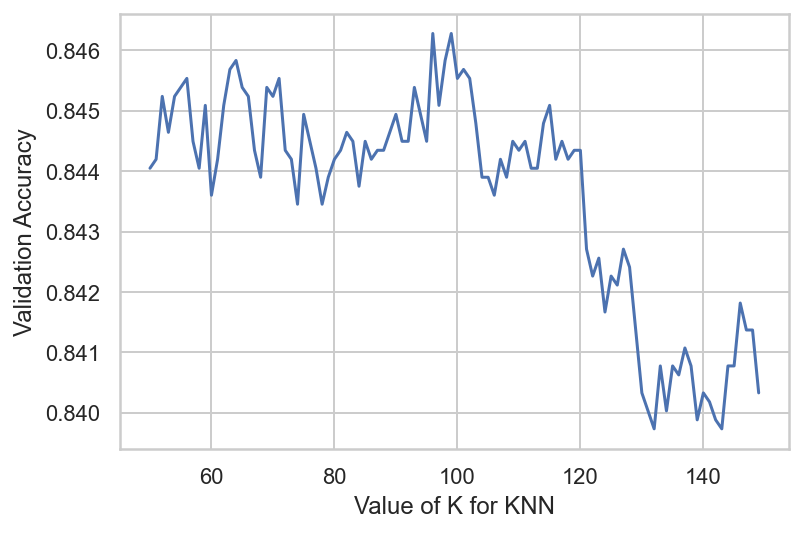

In [252]:
from sklearn.neighbors import KNeighborsClassifier

# try K=50 through K=150 and record testing accuracy
k_range = range(50, 150)

scores = []

# We use a loop through the range
# We append the scores in the list
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_val)
    scores.append(accuracy_score(y_val, y_pred))

# plot the relationship between K and testing accuracy
plt.plot(k_range, scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Validation Accuracy')

In [260]:
modelKNN1 = KNeighborsClassifier().fit(X = X_train, y = y_train)

In [261]:
modelKNN1.score(X_train, y_train)

0.8746173469387755

In [262]:
modelKNN1.score(X_val, y_val)

0.8373511904761904

In [263]:
modelKNN2 = KNeighborsClassifier(n_neighbors=100).fit(X = X_train, y = y_train)

In [266]:
modelKNN2.score(X_train, y_train)

0.8450255102040817

In [267]:
modelKNN2.score(X_val, y_val)

0.8455357142857143

In [277]:
#from the available algorithms (excluding the default), this was the best one
modelKNN3 = KNeighborsClassifier(n_neighbors=100, algorithm='ball_tree').fit(X = X_train, y = y_train)

In [278]:
modelKNN3.score(X_train, y_train)

0.8452806122448979

In [279]:
modelKNN3.score(X_val, y_val)

0.8459821428571429

In [280]:
modelKNN4 = KNeighborsClassifier(n_neighbors=100, p=1).fit(X = X_train, y = y_train)

In [281]:
modelKNN4.score(X_train, y_train)

0.8454081632653061

In [282]:
modelKNN4.score(X_val, y_val)

0.8464285714285714

In [283]:
modelKNN5 = KNeighborsClassifier(n_neighbors=100, weights='distance').fit(X = X_train, y = y_train)

In [284]:
modelKNN5.score(X_train, y_train)

0.9426658163265306

In [285]:
modelKNN5.score(X_val, y_val)

0.8369047619047619

In [286]:
modelKNN6 = KNeighborsClassifier(n_neighbors=100, algorithm='ball_tree', p=1).fit(X = X_train, y = y_train)

In [287]:
modelKNN6.score(X_train, y_train)

0.8454081632653061

In [288]:
modelKNN6.score(X_val, y_val)

0.846875

In [293]:
# Model with best accuracy
labels_train = modelKNN6.predict(X_train)
labels_val = modelKNN6.predict(X_val)
metrics(y_train, labels_train, y_val, labels_val)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     11962
           1       0.72      0.57      0.63      3718

    accuracy                           0.85     15680
   macro avg       0.80      0.75      0.77     15680
weighted avg       0.84      0.85      0.84     15680

[[11150   812]
 [ 1612  2106]]
___________________________________________________________________________________________________________
                                                VALIDATION                                                 
------------------------------------------------------------------------------------------------------

## Passive Aggressive Classifier (Extra)

In [294]:
from sklearn.linear_model import PassiveAggressiveClassifier

In [363]:
# Creating and fitting model
pac_basic = PassiveAggressiveClassifier().fit(X_train, y_train)

pac_1 = PassiveAggressiveClassifier(C=0.001, fit_intercept=True, tol=1e-2, loss='squared_hinge',\
                                    random_state=42).fit(X_train, y_train)

pac_2 = PassiveAggressiveClassifier(C=0.001, tol=1e-2, loss='squared_hinge',\
                                    random_state=42).fit(X_train, y_train)

pac_3 = PassiveAggressiveClassifier(C=0.001, tol=1e-2, random_state=42).fit(X_train, y_train)

In [364]:
# Making prediction on the validation set 
val_pred_basic = pac_basic.predict(X_val)
val_pred_1 = pac_1.predict(X_val)
val_pred_2 = pac_2.predict(X_val)
val_pred_3 = pac_3.predict(X_val)

In [365]:
# Model evaluation of the best PAC model
print(f"Validation Set Accuracy : {accuracy_score(y_val, val_pred_1) * 100} %\n\n")   
  
print(f"Classification Report : \n\n{classification_report(y_val, val_pred_1)}")

Validation Set Accuracy : 84.49404761904762 %


Classification Report : 

              precision    recall  f1-score   support

           0       0.86      0.95      0.90      5127
           1       0.76      0.51      0.61      1593

    accuracy                           0.84      6720
   macro avg       0.81      0.73      0.76      6720
weighted avg       0.84      0.84      0.83      6720



## Linear Discriminant Analysis

In [158]:
# evaluate a lda model on the dataset
from numpy import mean
from numpy import std
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

Mean Accuracy: 0.840 (0.006)


In [176]:
modelLDA = LinearDiscriminantAnalysis()
modelLDA.fit(X = X_train, y = y_train)
labels_train = modelLDA.predict(X_train)
labels_val = modelLDA.predict(X_val)
modelLDA.predict_proba(X_val)

array([[0.82721028, 0.17278972],
       [0.99408815, 0.00591185],
       [0.47144428, 0.52855572],
       ...,
       [0.72618119, 0.27381881],
       [0.22534779, 0.77465221],
       [0.95639608, 0.04360392]])

In [161]:
print("train score:", modelLDA.score(X_train, y_train))
print("validation score:",modelLDA.score(X_val, y_val))

train score: 0.8401147959183674
validation score: 0.8425595238095238


In [179]:
from sklearn.model_selection import GridSearchCV
# define grid
grid = dict()
grid['solver'] = ['svd', 'lsqr', 'eigen']
# define search
search = GridSearchCV(modelLDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.840
Config: {'solver': 'lsqr'}


In [180]:
from numpy import arange
grid = dict()
grid['shrinkage'] = arange(0, 1, 0.01)
grid['solver']=['svd', 'lsqr', 'eigen'] #svd cannot be tested with shrinkage
# define search
search = GridSearchCV(modelLDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.840
Config: {'shrinkage': 0.0, 'solver': 'lsqr'}


In [186]:
modelLDA_final = LinearDiscriminantAnalysis(solver='lsqr')
modelLDA_final.fit(X = X_train, y = y_train)
labels_train = modelLDA_final.predict(X_train)
labels_val = modelLDA_final.predict(X_val)
print("train score:", modelLDA_final.score(X_train, y_train))
print("validation score:",modelLDA_final.score(X_val, y_val))

train score: 0.8401147959183674
validation score: 0.8425595238095238


## Quadratic Discriminant Analysis

In [181]:
modelQDA = QuadraticDiscriminantAnalysis()
modelQDA.fit(X = X_train, y = y_train)
labels_train = modelQDA.predict(X_train)
labels_val = modelQDA.predict(X_val)
modelQDA.predict_proba(X_val)

array([[9.99714494e-01, 2.85506288e-04],
       [9.99999600e-01, 3.99624824e-07],
       [9.60581659e-01, 3.94183409e-02],
       ...,
       [9.99443273e-01, 5.56726951e-04],
       [9.23887352e-01, 7.61126477e-02],
       [9.99997128e-01, 2.87230751e-06]])

In [182]:
print("train score:", modelQDA.score(X_train, y_train))
print("validation score:",modelQDA.score(X_val, y_val))

train score: 0.8095025510204081
validation score: 0.8159226190476191


In [183]:
# define grid
grid = dict()
grid['reg_param'] = arange(0, 1, 0.01)
# define search
search = GridSearchCV(modelQDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(X_train, y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.833
Config: {'reg_param': 0.14}


In [185]:
modelQDA_final = QuadraticDiscriminantAnalysis(reg_param=0.14)
modelQDA_final.fit(X = X_train, y = y_train)
labels_train = modelQDA_final.predict(X_train)
labels_val = modelQDA_final.predict(X_val)
print("train score:", modelQDA_final.score(X_train, y_train))
print("validation score:",modelQDA_final.score(X_val, y_val))

train score: 0.8341198979591836
validation score: 0.8394345238095238
